In [1]:
legend_utils_path = '/global/homes/f/fnafis/LEGEND/legend'
import sys
if legend_utils_path not in sys.path:
    sys.path.append(legend_utils_path)
import uproot as ur
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import curve_fit
import pygama.math.histogram as pgh
import legend_utils as lu
from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import FormatStrFormatter
plt.style.use('~/KrSTC/data/physrev.mpl')
import dataframe_image as dfi
def get_peak_and_bkg_count(h, b):
    b_mids = (b[1:] + b[:-1])/2
    fit_params = lu.fit_peak_binned_extra_basic(b_mids, h)
    peak_count = fit_params['area']
    return peak_count, np.sum(h) - peak_count, (np.sum(h) - peak_count)/(b[-1]-b[0])


def get_param_map(df, param='bkg_density', id='mage_id', round_to=None):
    map = pd.DataFrame()
    for i, val in zip(df[id], df[param]):
        ii = str(i)
        col = int(ii[3:5])
        row = int(ii[5:7])
        if round_to is None:
            map.at[row, col] = val
        else:
            map.at[row, col] = round(val, round_to)
    # sort the columns
    map = map.reindex(sorted(map.columns), axis=1)
    # add 'String ' to the columns
    map.columns = ['String ' + str(col) for col in map.columns]
    # sort the rows
    map = map.sort_index(ascending=True)
    return map

def get_bkg_density(full_Co_df, full_Co_primaries, geds, peak, plot=False):
    
    # print('geds', geds)
    d = full_Co_df[full_Co_df['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
    b_mids = (b[1:] + b[:-1])/2
    # get counts within sidebands regions of the peak
    bkg_bins_left = h[(b_mids > peak['sidebands'][0][0]) & (b_mids < peak['sidebands'][0][1])]
    bkg_bins_right = h[(b_mids > peak['sidebands'][1][0]) & (b_mids < peak['sidebands'][1][1])]
    bkg_region_keV = (peak['sidebands'][0][1] - peak['sidebands'][0][0]) + (peak['sidebands'][1][1] - peak['sidebands'][1][0])
    bkg_density = (np.sum(bkg_bins_left)+np.sum(bkg_bins_right))/bkg_region_keV/full_Co_primaries
    if plot:
        ged_str = str(geds[0])
        row = int(ged_str[5:7])-1
        col = int(ged_str[3:5])-1
        ax[row, col].plot(b_mids, h, ds='steps', lw=1, color='k')
        # fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[row, col], lw=1)
        ax[row, col].set_xlabel('Energy (keV)')
        ax[row, col].set_ylabel('Counts/'+str(binsize)+' keV')
        ax[row, col].set_title(str(geds) + ' ' + str(round(bkg_density*1e6, 2))+' bkg/keV/1MCo')
    return bkg_density

def get_DEP_peak_counts(df_gamma, scaled_Co_primaries, geds, peak, bkg_density):
    # print('geds', geds)
    d = df_gamma[df_gamma['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
    b_mids = (b[1:] + b[:-1])/2
    
    fit_params = lu.fit_peak_binned_extra_basic(b_mids, h)
    if fit_params['area'] is None:
        peak_count = 0
    else:
        peak_count = fit_params['area'] if ((fit_params['popt'][1] > peak['peak_range'][0]) & (fit_params['popt'][1] < peak['peak_range'][1]) & (fit_params['area']>0) & (fit_params['fwhm']<6.0)) else 0

    if bkg_density is not None:
        N = peak_count + bkg_density*scaled_Co_primaries*(peak['peak_range'][1]-peak['peak_range'][0])
        B = bkg_density*scaled_Co_primaries*(peak['sidebands'][1][1]-peak['sidebands'][1][0]+ peak['sidebands'][0][1]-peak['sidebands'][0][0])
        return (N,B)
    else:
        return (None,None)
    
def get_rel_unc(NB, peak):
    tau = (peak['sidebands'][1][0]-peak['sidebands'][0][1])/(peak['sidebands'][1][1]-peak['sidebands'][1][0]+peak['sidebands'][0][1]-peak['sidebands'][0][0])
    epsilon = 0.86
    N = NB[0]
    B = NB[1]
    
    N_c = N*epsilon
    B_c = B*epsilon
    t1 = (N+tau**2*B)/((N-tau*B)**2)
    t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
    t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
    rel_unc_sqrd =  t1 + t2 - t3
    rel_unc = np.sqrt(rel_unc_sqrd)
    # print(N, B, tau, N_c, B_c, t1, t2, t3, rel_unc_sqrd, rel_unc)
    return rel_unc
    
def get_survival_frac_unc_at_end(unc, Co_primaries, rundays, source_activity_Bq):
    half_life = 77.236 # days
    decay_constant = np.log(2)/half_life # 1/s
    N = source_activity_Bq*86400/decay_constant*(1-np.exp(-decay_constant*rundays))
    uncertainty = unc*np.sqrt(Co_primaries/N)
    return uncertainty


results_dir = '/global/homes/f/fnafis/LEGEND/legend/sims/plots_tables/'
binsize = 0.2 # keV

In [2]:
peaks = {
    '1576':
    {
        'name': '1576',
        'type': 'DEP',
        'energy': 1576.5,
        'sidebands':[[1565,1574],[1579,1590]],
        'peak_range': [1574,1579],
        'branching_ratio': 0.1697
    },
    '1987':
    {
        'name': '1987',
        'type': 'DEP',
        'energy':1987.0,
        'sidebands':[[1975,1983],[1991,2000]],
        'peak_range': [1983,1991],
        'branching_ratio': 0.01036
    },
    '2231':
    {
        'name': '2231',
        'type': 'DEP',
        'energy': 2231.0,
        'sidebands':[[2222,2229],[2235,2240]],
        'peak_range': [2229,2235],
        'branching_ratio': 0.07923
    }
}
# '3009':
#     {
#         'name': '3009',
#         'type': 'FEP',
#         'energy':3009.6,
#         'sidebands':[[2995,3000],[3020,3025]],
#         'peak_range': [3005,3015]
#     }


Load all files

In [3]:
df_all = pd.DataFrame()

evt_filenames_all = '/global/homes/f/fnafis/LEGEND/legend/sims/all_evt_filenames.txt'


with open(evt_filenames_all) as f:
    evt_filenames = f.read().splitlines()
    for evt_filename in evt_filenames:
        # print(evt_filename)
        # extract the number after sis
        sis = evt_filename.split('sis')[1].split('_')[0]
        # extract pos 
        pos = evt_filename.split('pos')[1].split('_')[0]
        # extract the string after pos and the number before .root
        source_type = evt_filename.split('pos')[1].split('_')[1].split('.')[0]
        # print(sis, pos, source_type)
        ff = ur.open(evt_filename)
        # print(evt_filename, 'opened')
        dets = ff['simTree/mage_id'].array(library='np')
        # primaries_full_Co += len(dets)
        dets = np.concatenate(dets)
        energies = ff['simTree/energy'].array(library='np')
        energies = np.concatenate(energies)
        d = pd.DataFrame({'mage_id': dets, 'energy': energies, 'sis': sis, 'pos': pos, 'type':source_type})
        df_all = pd.concat([df_all, d], ignore_index=True)
df_all['energy'] = df_all['energy'].apply(lambda x: x*1000)
df_all['sispos'] = df_all['sis']+df_all['pos']
df_all

,mage_id,energy,sis,pos,type,sispos
0,1010204,1040.383503,1,0,fullCo,10
1,1010303,847.880782,1,0,fullCo,10
2,1011103,610.360436,1,0,fullCo,10
3,1010103,244.791006,1,0,fullCo,10
4,1011102,313.316017,1,0,fullCo,10
...,...,...,...,...,...,...
75010234,1010703,120.412142,3,4,gamma3253,34
75010235,1010308,98.650499,3,4,gamma3253,34
75010236,1010410,231.346834,3,4,gamma3253,34
75010237,1010107,2743.431100,3,4,gamma3253,34


In [40]:
df_all['sispos'] = df_all['sis']+df_all['pos']
df_all

,mage_id,energy,sis,pos,type,sispos
0,1010204,1040.383503,1,0,fullCo,10
1,1010303,847.880782,1,0,fullCo,10
2,1011103,610.360436,1,0,fullCo,10
3,1010103,244.791006,1,0,fullCo,10
4,1011102,313.316017,1,0,fullCo,10
...,...,...,...,...,...,...
75010234,1010703,120.412142,3,4,gamma3253,34
75010235,1010308,98.650499,3,4,gamma3253,34
75010236,1010410,231.346834,3,4,gamma3253,34
75010237,1010107,2743.431100,3,4,gamma3253,34


In [118]:
def get_dep_unc(df_all, source_positions, geds, rundays=14, source_activity_Bq=1.85e3):
    df_sispos = df_all[(df_all['sispos'].isin(source_positions))]
    df_sispos = df_sispos[df_sispos['mage_id'].isin(geds)]

    df_fullCo = df_sispos[df_sispos['type']=='fullCo']
    df_gamma2598 = df_sispos[df_sispos['type']=='gamma2598']
    df_gamma3009 = df_sispos[df_sispos['type']=='gamma3009']
    df_gamma3253 = df_sispos[df_sispos['type']=='gamma3253']
    Co_primaries = gamma2598_primaries = gamma3253_primaries = len(source_positions)*2e6
    
    deps = [int(key) for key in peaks.keys()]
    uncs = []

    peak = peaks['1576']
    df_gamma = df_gamma2598
    scaled_Co_primaries = len(source_positions)*2e6/peak['branching_ratio']
    # get bkg density
    bkg_density = get_bkg_density(df_fullCo, Co_primaries, geds, peak=peak, plot=False)
    # print('bkg density',bkg_density)
    N,B = get_DEP_peak_counts(df_gamma, scaled_Co_primaries, geds, peak, bkg_density)
    # print('N',N,'B',B)
    rel_unc = get_rel_unc((N,B), peak)
    # print(rel_unc)
    unc = get_survival_frac_unc_at_end(rel_unc, scaled_Co_primaries, rundays, source_activity_Bq)
    # print('unc', unc)
    uncs.append(unc)

    peak = peaks['1987']
    df_gamma = df_gamma3009
    scaled_Co_primaries = len(source_positions)*2e6/peak['branching_ratio']
    # get bkg density
    bkg_density = get_bkg_density(df_fullCo, Co_primaries, geds, peak=peak, plot=False)
    # print('bkg density',bkg_density)
    N,B = get_DEP_peak_counts(df_gamma, scaled_Co_primaries, geds, peak, bkg_density)
    # print('N',N,'B',B)
    rel_unc = get_rel_unc((N,B), peak)
    # print(rel_unc)
    unc = get_survival_frac_unc_at_end(rel_unc, scaled_Co_primaries, rundays, source_activity_Bq)
    # print('unc', unc)
    uncs.append(unc)

    peak = peaks['2231']
    df_gamma = df_gamma3253
    scaled_Co_primaries = len(source_positions)*2e6/peak['branching_ratio']
    # get bkg density
    bkg_density = get_bkg_density(df_fullCo, Co_primaries, geds, peak=peak, plot=False)
    # print('bkg density',bkg_density)
    N,B = get_DEP_peak_counts(df_gamma, scaled_Co_primaries, geds, peak, bkg_density)
    # print('N',N,'B',B)
    rel_unc = get_rel_unc((N,B), peak)
    # print(rel_unc)
    unc = get_survival_frac_unc_at_end(rel_unc, scaled_Co_primaries, rundays, source_activity_Bq)
    unc = 0 if unc>100 else unc
    # print('unc', unc)
    uncs.append(unc)

    #print(deps, uncs)

    # def linear_fit(x, m, c):
    #     return m*x + c
    # popt, pcov = curve_fit(linear_fit, deps, uncs)
    # # print(popt)
    # unc_2039 = linear_fit(2039, *popt)
    # # print(unc_2039)
    # print(geds, uncs)
    return uncs

    


get_dep_unc(df_all, source_positions=['11','12','13','14','21','22','23','24','31','32','33','34'], geds=[1010704], rundays=5)
    

[0.008737079597101242, 0.08776538251760282, 0.009732696594279375]

In [119]:
# mid march
geds = df_all['mage_id'].unique()
unc_df = pd.DataFrame({'mage_id':geds})
for ged in geds:
    uncs = get_dep_unc(df_all, source_positions=['10'], geds=[ged], rundays=5, source_activity_Bq=8.6*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_1'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_1'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_1'] = uncs[2]
    uncs = get_dep_unc(df_all, source_positions=['11'], geds=[ged], rundays=5, source_activity_Bq=6.4*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_2'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_2'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_2'] = uncs[2]
    uncs = get_dep_unc(df_all, source_positions=['20'], geds=[ged], rundays=5, source_activity_Bq=14.4*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_3'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_3'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_3'] = uncs[2]
    uncs = get_dep_unc(df_all, source_positions=['30'], geds=[ged], rundays=5, source_activity_Bq=21.5*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_4'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_4'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_4'] = uncs[2]

    # after 7 days, we lower down the sources
    uncs = get_dep_unc(df_all, source_positions=['11'], geds=[ged], rundays=7, source_activity_Bq=8.1*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_1_2'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_1_2'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_1_2'] = uncs[2]
    uncs = get_dep_unc(df_all, source_positions=['12'], geds=[ged], rundays=7, source_activity_Bq=4.3*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_2_2'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_2_2'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_2_2'] = uncs[2]
    uncs = get_dep_unc(df_all, source_positions=['21'], geds=[ged], rundays=7, source_activity_Bq=13.5*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_3_2'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_3_2'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_3_2'] = uncs[2]
    uncs = get_dep_unc(df_all, source_positions=['31'], geds=[ged], rundays=7, source_activity_Bq=20.2*1000)
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1576_4_2'] = uncs[0]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_1987_4_2'] = uncs[1]
    unc_df.loc[unc_df['mage_id']==ged, 'unc_2231_4_2'] = uncs[2]
unc_df


/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:91: RuntimeWarning: divide by zero encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_501239/622686866.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3
/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_501239/622686866.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3
/tmp/ipykernel_501239/62268686

fit failed


/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:91: RuntimeWarning: divide by zero encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_501239/622686866.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3
/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: invalid value encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:91: RuntimeWarning: invalid value encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: invalid value encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)


fit failed


/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_501239/622686866.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3
/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:91: RuntimeWarning: divide by zero encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_501239/622686866.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3


fit failed


/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: invalid value encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:91: RuntimeWarning: invalid value encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: invalid value encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/opt/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/global/homes/f/fnafis/LEGEND/legend/legend_utils.py:381: RuntimeWarning: invalid value encountered in scalar add
  area_err = area*np.sqrt((A_err/A)**2 + (sigma_err/sigma)**2 + 2*cov_A_sigma/(A*sigma)) # https://www.ucl.ac.uk/~ucfbpve/geotopes/indexch10.html


fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed


/global/homes/f/fnafis/LEGEND/legend/legend_utils.py:381: RuntimeWarning: invalid value encountered in scalar multiply
  area_err = area*np.sqrt((A_err/A)**2 + (sigma_err/sigma)**2 + 2*cov_A_sigma/(A*sigma)) # https://www.ucl.ac.uk/~ucfbpve/geotopes/indexch10.html


fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed
fit failed


,mage_id,unc_1576_1,unc_1987_1,unc_2231_1,unc_1576_2,unc_1987_2,unc_2231_2,unc_1576_3,unc_1987_3,unc_2231_3,...,unc_2231_1_2,unc_1576_2_2,unc_1987_2_2,unc_2231_2_2,unc_1576_3_2,unc_1987_3_2,unc_2231_3_2,unc_1576_4_2,unc_1987_4_2,unc_2231_4_2
0,1010204,NaN,NaN,NaN,0.009317,NaN,0.025942,0.004887,NaN,NaN,...,0.019549,NaN,0.366620,0.063895,NaN,1.162167,NaN,0.005772,NaN,0.014020
1,1010303,0.008135,0.098673,0.154401,0.010289,0.108346,0.014127,0.007326,NaN,NaN,...,0.010646,0.177516,NaN,0.018550,0.006238,0.019479,0.018040,0.002760,0.071378,0.003370
2,1011103,0.001193,0.008547,0.001288,0.002949,0.020517,0.003523,0.007301,0.053412,0.007519,...,0.002655,0.007451,0.070673,0.019479,NaN,0.062653,0.018663,NaN,NaN,0.012107
3,1010103,0.016980,0.086611,0.006524,0.009593,0.048242,0.010892,0.006607,0.199488,0.008361,...,0.008208,0.008301,0.053745,0.011839,NaN,NaN,NaN,0.006136,0.191968,0.008443
4,1011102,0.001280,0.011909,0.001704,0.005212,0.047954,0.006053,0.011657,0.100712,0.007645,...,0.004562,0.011782,0.089968,0.021290,0.005879,NaN,0.021823,0.009450,0.106538,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,1010810,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.064453,NaN,NaN,0.039167
97,1010913,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.179039,NaN,NaN,NaN,NaN,0.008358,NaN,0.036888
98,1011113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.079951,NaN,NaN,NaN,NaN,NaN,NaN
99,1010209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.505444,NaN,NaN,NaN,NaN,NaN,NaN


In [120]:
unc_df = unc_df.fillna(0)
# set any value >100 to 0
unc_df[unc_df>100] = 0
unc_df['unc_1576'] = np.sqrt(unc_df['unc_1576_1']**2+unc_df['unc_1576_2']**2+unc_df['unc_1576_3']**2+unc_df['unc_1576_4']**2 + unc_df['unc_1576_1_2']**2+unc_df['unc_1576_2_2']**2+unc_df['unc_1576_3_2']**2+unc_df['unc_1576_4_2']**2)
unc_df['unc_1987'] = np.sqrt(unc_df['unc_1987_1']**2+unc_df['unc_1987_2']**2+unc_df['unc_1987_3']**2+unc_df['unc_1987_4']**2 + unc_df['unc_1987_1_2']**2+unc_df['unc_1987_2_2']**2+unc_df['unc_1987_3_2']**2+unc_df['unc_1987_4_2']**2)
unc_df['unc_2231'] = np.sqrt(unc_df['unc_2231_1']**2+unc_df['unc_2231_2']**2+unc_df['unc_2231_3']**2+unc_df['unc_2231_4']**2 + unc_df['unc_2231_1_2']**2+unc_df['unc_2231_2_2']**2+unc_df['unc_2231_3_2']**2+unc_df['unc_2231_4_2']**2)
unc_df

,mage_id,unc_1576_1,unc_1987_1,unc_2231_1,unc_1576_2,unc_1987_2,unc_2231_2,unc_1576_3,unc_1987_3,unc_2231_3,...,unc_2231_2_2,unc_1576_3_2,unc_1987_3_2,unc_2231_3_2,unc_1576_4_2,unc_1987_4_2,unc_2231_4_2,unc_1576,unc_1987,unc_2231
0,0,0.000000,0.000000,0.000000,0.009317,0.000000,0.025942,0.004887,0.000000,0.000000,...,0.063895,0.000000,1.162167,0.000000,0.005772,0.000000,0.014020,0.014798,1.218882,0.075521
1,0,0.008135,0.098673,0.154401,0.010289,0.108346,0.014127,0.007326,0.000000,0.000000,...,0.018550,0.006238,0.019479,0.018040,0.002760,0.071378,0.003370,0.178466,0.184902,0.157618
2,0,0.001193,0.008547,0.001288,0.002949,0.020517,0.003523,0.007301,0.053412,0.007519,...,0.019479,0.000000,0.062653,0.018663,0.000000,0.000000,0.012107,0.013501,0.113664,0.031684
3,0,0.016980,0.086611,0.006524,0.009593,0.048242,0.010892,0.006607,0.199488,0.008361,...,0.011839,0.000000,0.000000,0.000000,0.006136,0.191968,0.008443,0.024142,0.320284,0.023113
4,0,0.001280,0.011909,0.001704,0.005212,0.047954,0.006053,0.011657,0.100712,0.007645,...,0.021290,0.005879,0.000000,0.021823,0.009450,0.106538,0.000000,0.022031,0.188538,0.041389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.064453,0.000000,0.000000,0.039167,0.000000,0.000000,0.075420
97,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.008358,0.000000,0.036888,0.008358,0.179039,0.036888
98,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.079951,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.079951
99,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.505444,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.505444


In [138]:
unc_df[(unc_df['unc_1576']>0.03) & (unc_df['unc_1576']<0.05)].shape

(11, 28)

In [123]:
unc_df['mage_id'] = geds

In [130]:
get_param_map(unc_df*100, param='unc_1576', id='mage_id', round_to=1)


,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,2.0,10.4,1.6,4.1,21.1,2.6,2.1,1.5,54.3,1.7
2,3.0,1.8,2.6,3.7,2.9,2.9,2.1,1.8,2.6,2.2
3,2.4,4.2,17.8,6.8,5.9,2.4,2.0,1.7,1.2,1.4
4,1.4,1.5,1.9,2.5,46.1,3.6,2.4,1.6,1.4,0.8
5,25.2,4.6,2.6,1.7,2.3,9.3,2.4,2.3,1.4,1.0
6,0.0,1.8,2.0,4.0,NaN,0.0,3.4,1.8,0.9,2.7
7,0.0,1.0,1.8,1.9,NaN,3.2,1.2,2.6,1.6,5.5
8,3.8,1.7,1.8,2.9,NaN,NaN,0.0,3.6,1.5,2.7
9,0.0,0.0,18.0,1.6,NaN,NaN,0.0,1.6,1.9,2.4
10,NaN,NaN,NaN,9.9,NaN,NaN,0.0,2.7,2.1,0.0


In [127]:
get_param_map(unc_df*100, param='unc_1987', id='mage_id', round_to=1)

,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,33.2,25.7,33.5,117.5,9.8,25.5,23.9,15.5,20.0,23.5
2,20.6,40.3,61.0,269.1,35.1,35.6,15.3,16.3,19.6,18.9
3,32.0,50.1,18.5,40.6,5618.2,30.5,44.4,17.5,26.4,11.4
4,35.0,121.9,47.3,72.6,20.7,147.3,19.1,17.4,6.9,16.9
5,852.4,47.8,37.4,38.3,45.5,65.4,20.4,15.1,12.8,9.3
6,345.0,1445.4,26.7,95.4,NaN,30.0,28.5,13.1,17.6,35.4
7,38.5,284.8,78.1,8.1,NaN,28.2,496.8,18.7,15.3,24.5
8,6.7,3.8,217.1,15.6,NaN,NaN,40.5,247.1,16.3,7.6
9,7.0,0.0,38.9,22.4,NaN,NaN,37.2,0.0,34.7,803.9
10,NaN,NaN,NaN,0.0,NaN,NaN,0.0,459.7,49.3,21.6


In [128]:
get_param_map(unc_df*100, param='unc_2231', id='mage_id', round_to=1)

,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,2.9,4.4,8.7,4.5,2.2,3.1,3.2,4.4,2.6,3.4
2,2.4,4.5,3.1,37.6,0.7,2.9,2.6,3.1,2.2,4.1
3,2.3,3.4,15.8,5.4,9.8,5.3,3.9,2.4,2.4,3.2
4,3.3,7.6,2.1,3.3,5.8,3.9,2.3,1.7,14.1,1.7
5,4.2,9.7,2.9,9.6,2.9,1.3,3.2,2.0,1.3,1.7
6,5.0,41.5,4.5,5.8,NaN,0.5,5.3,26.0,2.8,3.3
7,3.8,2.1,3.2,2.0,NaN,5.5,27.4,2.6,2.3,27.8
8,1.2,0.0,4.8,2.9,NaN,NaN,4.2,2.4,2.3,5.0
9,10.5,150.5,8.7,21.5,NaN,NaN,1.2,5.5,4.3,69.5
10,NaN,NaN,NaN,9.2,NaN,NaN,7.5,3.4,6.3,4.1


In [92]:
geds = df_all['mage_id'].unique()
uncs_1576 = []
uncs_1987 = []
uncs_2231 = []
for ged in geds:
    uncs = get_2039_unc(df_all, source_positions=['11','12','13','14','21','22','23','24','31','32','33','34'], geds=[ged], rundays=7, source_activity_Bq=15000)
    uncs_1576.append(uncs[0])
    uncs_1987.append(uncs[1])
    uncs_2231.append(uncs[2])

unc_df = pd.DataFrame({'mage_id':geds,'unc_1576':uncs_1576, 'unc_1987': uncs_1987, 'unc_2231':uncs_2231})

/tmp/ipykernel_501239/622686866.py:90: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_501239/622686866.py:91: RuntimeWarning: divide by zero encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_501239/622686866.py:92: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_501239/622686866.py:93: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3


fit failed
fit failed


SHORTER PROPOSAL

# Load sim energy and dets

In [29]:
# Load full Co sim first
# If you include all the filenames on all position, it will cover full array automatically
evt_filenames_full_Co = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_fullCo.txt'
# evt_filenames_full_Co = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_fullCo_sis2_pos3_new.txt'
# evt_filenames_full_Co = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_sis2_pos3_fullCo.txt'
df_full_Co = pd.DataFrame()
primaries_full_Co = 0
with open(evt_filenames_full_Co) as f:
    evt_filenames = f.read().splitlines()
    for evt_filename in evt_filenames:
        ff = ur.open(evt_filename)
        # print(evt_filename, 'opened')
        dets = ff['simTree/mage_id'].array(library='np')
        primaries_full_Co += len(dets)
        dets = np.concatenate(dets)
        energies = ff['simTree/energy'].array(library='np')
        energies = np.concatenate(energies)
        d = pd.DataFrame({'mage_id': dets, 'energy': energies})
        df_full_Co = pd.concat([df_full_Co, d], ignore_index=True)
   
print('primaries full Co', primaries_full_Co)
df_full_Co['energy'] = df_full_Co['energy'].apply(lambda x: x*1000)
df_full_Co

primaries full Co 23998898


,mage_id,energy
0,1011105,101.652600
1,1010802,439.593799
2,1011004,440.901101
3,1010905,123.893967
4,1011002,129.442239
...,...,...
28408689,1011009,3273.346145
28408690,1010504,1.002271
28408691,1010505,557.259451
28408692,1010505,243.904711


In [30]:
cm = lu.get_count_map(df_full_Co)
cm = cm
cm_fraction = cm/cm.sum().sum()
# cm_fraction.to_csv(results_dir+'heatmap_24MfullCo.csv')
# dfi.export(cm_fraction, results_dir+'heatmap_24MfullCo.png')
(cm_fraction).round(2)

,string 1,string 2,string 3,string 4,string 5,string 7,string 8,string 9,string 10,string 11
1,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00
2,0.01,0.00,0.00,0.00,0.02,0.03,0.00,0.00,0.00,0.00
3,0.01,0.01,0.00,0.00,0.07,0.05,0.02,0.00,0.00,0.00
4,0.01,0.01,0.00,0.01,0.05,0.06,0.02,0.01,0.01,0.02
5,0.01,0.01,0.01,0.01,0.04,0.04,0.03,0.01,0.01,0.02
6,0.01,0.01,0.01,0.01,NaN,0.01,0.02,0.01,0.01,0.03
7,0.00,0.00,0.01,0.01,NaN,0.00,0.01,0.01,0.01,0.02
8,0.00,0.00,0.00,0.02,NaN,NaN,0.00,0.01,0.01,0.02
9,0.00,0.00,0.00,0.01,NaN,NaN,0.00,0.01,0.02,0.01
10,NaN,NaN,NaN,0.01,NaN,NaN,0.00,0.00,0.02,0.00


In [5]:
# # get bkg_density df
# fig, ax = plt.subplots(14,11, figsize=(70,80.5), sharex=False, sharey=False)
# geds = df_full_Co['mage_id'].unique()
# def get_bkg_per_keV_per_primary(full_Co_df, full_Co_primaries, geds, peak, plot=True):
    
#     # print('geds', geds)
#     d = full_Co_df[full_Co_df['mage_id'].isin(geds)]
#     h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
#     b_mids = (b[1:] + b[:-1])/2
#     if plot:
#         ged_str = str(geds[0])
#         row = int(ged_str[5:7])-1
#         col = int(ged_str[3:5])-1
#         ax[row, col].plot(b_mids, h, ds='steps', lw=1, color='k')
#         fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[row, col], lw=1)
#         ax[row, col].set_xlabel('Energy (keV)')
#         ax[row, col].set_ylabel('Counts/'+str(binsize)+' keV')
#     else:
#         fit_params = lu.fit_peak_binned_extra_basic(b_mids, h)
#     if fit_params['area'] is None:
#         peak_count = 0
#     else:
#         peak_count = fit_params['area'] if ((fit_params['popt'][1] > peak['peak_range'][0]) & (fit_params['popt'][1] < peak['peak_range'][1]) & (fit_params['area']>0) & (fit_params['fwhm']<4.0)) else 0
#     bkg_density = (np.sum(h) - peak_count)/(b[-1]-b[0])/full_Co_primaries
#     if plot:
#         ax[row, col].set_title(str(geds) + ' ' + str(round(bkg_density*1e6, 2))+' bkg/keV/1MCo')
#     return bkg_density
# bkg_density = []
# for ged in geds:
#     bkg_density.append(get_bkg_per_keV_per_primary(df_full_Co, primaries_full_Co, [ged], peaks['1987']))
# bkg_density_df = pd.DataFrame({'mage_id': geds, 'bkg_density': bkg_density})
# print(bkg_density_df)
# bkg_density_map = get_param_map(bkg_density_df, param='bkg_density', id='mage_id')
# (bkg_density_map*1e6).round(2)
# fig.savefig(results_dir+'spectra_with_2M_fullCo_sim.png')

     mage_id   bkg_density
0    1011105  5.809090e-07
1    1010802  3.676639e-08
2    1011004  1.421634e-07
3    1010905  2.083429e-07
4    1011002  7.598388e-08
..       ...           ...
96   1010412  1.225546e-08
97   1011113  9.804372e-09
98   1011013  1.225546e-08
99   1010912  1.960874e-08
100  1010914  9.804372e-09

[101 rows x 2 columns]


,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,0.08,0.02,0.02,0.03,0.07,0.15,0.02,0.02,0.02,0.03
2,0.11,0.09,0.03,0.07,0.62,0.88,0.04,0.05,0.08,0.06
3,0.24,0.15,0.07,0.09,3.22,2.08,0.43,0.06,0.10,0.08
4,0.22,0.18,0.06,0.14,1.94,2.49,0.63,0.13,0.14,0.47
5,0.16,0.20,0.13,0.19,1.50,1.65,0.73,0.21,0.24,0.58
6,0.10,0.14,0.13,0.25,NaN,0.36,0.69,0.22,0.25,0.73
7,0.08,0.08,0.13,0.24,NaN,0.06,0.35,0.24,0.27,0.54
8,0.02,0.03,0.09,0.44,NaN,NaN,0.13,0.17,0.21,0.35
9,0.02,0.03,0.06,0.35,NaN,NaN,0.06,0.09,0.59,0.25
10,NaN,NaN,NaN,0.17,NaN,NaN,0.01,0.09,0.42,0.05


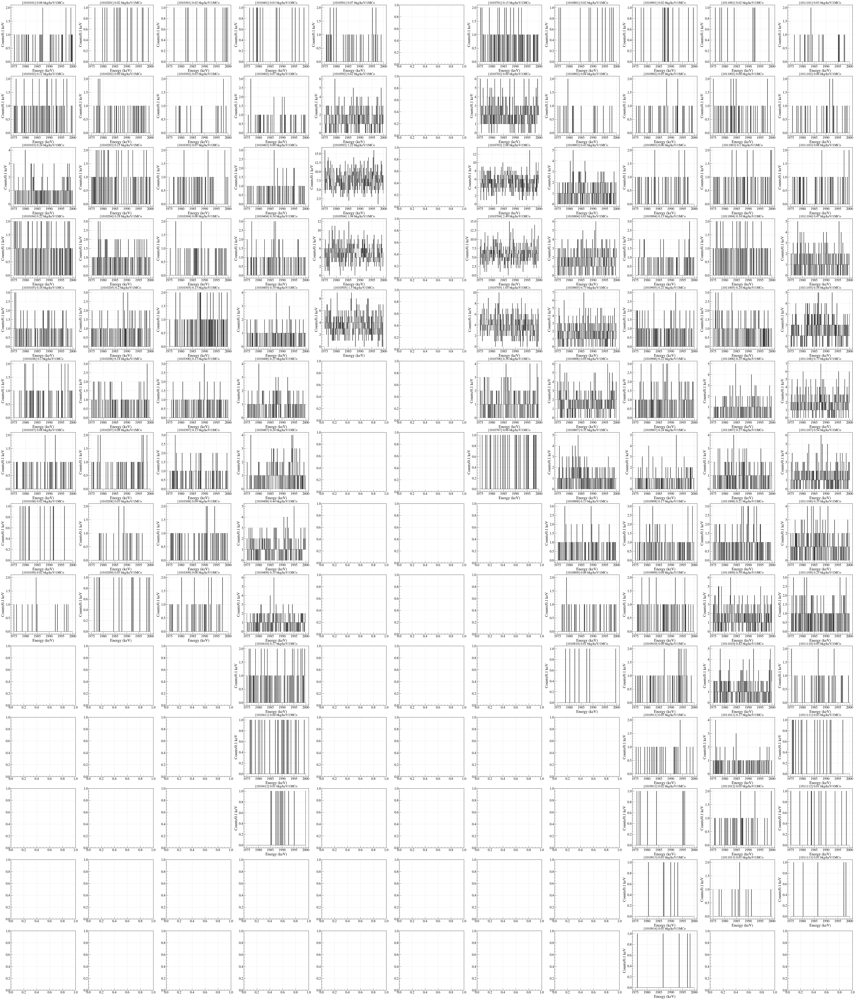

In [32]:
# get bkg_density df
fig, ax = plt.subplots(14,11, figsize=(70,80.5), sharex=False, sharey=False)
geds = df_full_Co['mage_id'].unique()
def get_bkg_density(full_Co_df, full_Co_primaries, geds, peak, plot=True):
    
    # print('geds', geds)
    d = full_Co_df[full_Co_df['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
    b_mids = (b[1:] + b[:-1])/2
    # get counts within sidebands regions of the peak
    bkg_bins_left = h[(b_mids > peak['sidebands'][0][0]) & (b_mids < peak['sidebands'][0][1])]
    bkg_bins_right = h[(b_mids > peak['sidebands'][1][0]) & (b_mids < peak['sidebands'][1][1])]
    bkg_region_keV = (peak['sidebands'][0][1] - peak['sidebands'][0][0]) + (peak['sidebands'][1][1] - peak['sidebands'][1][0])
    bkg_density = (np.sum(bkg_bins_left)+np.sum(bkg_bins_right))/bkg_region_keV/full_Co_primaries
    if plot:
        ged_str = str(geds[0])
        row = int(ged_str[5:7])-1
        col = int(ged_str[3:5])-1
        ax[row, col].plot(b_mids, h, ds='steps', lw=1, color='k')
        # fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[row, col], lw=1)
        ax[row, col].set_xlabel('Energy (keV)')
        ax[row, col].set_ylabel('Counts/'+str(binsize)+' keV')
        ax[row, col].set_title(str(geds) + ' ' + str(round(bkg_density*1e6, 2))+' bkg/keV/1MCo')
    return bkg_density

bkg_density = []
for ged in geds:
    bkg_density.append(get_bkg_density(df_full_Co, primaries_full_Co, [ged], peaks['1987'], plot=True))
bkg_density_df = pd.DataFrame({'mage_id': geds, 'bkg_density': bkg_density})
print(bkg_density_df)
bkg_density_map = get_param_map(bkg_density_df, param='bkg_density', id='mage_id')
# bkg_density_filename = 'bkg_density-all_det-24M_56Co_sim'
bkg_density_filename = 'bkg_density-all_det-24M_56Co_sim'
bkg_density_map.to_csv(results_dir+bkg_density_filename+'.csv')
fig.savefig(results_dir+bkg_density_filename+'.png')

(bkg_density_map*1e6).round(2)


In [36]:
# Now load only gamma simulation data
evt_filenames_gamma = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_gamma3009.txt'
# evt_filenames_gamma = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_sis2_pos3_gamma3009.txt'
df_gamma = pd.DataFrame()
primaries_gamma = 0
with open(evt_filenames_gamma) as f:
    evt_filenames = f.read().splitlines()
    for evt_filename in evt_filenames:
        ff = ur.open(evt_filename)
        # print(evt_filename, 'opened')
        dets = ff['simTree/mage_id'].array(library='np')
        primaries_gamma += len(dets)
        dets = np.concatenate(dets)
        energies = ff['simTree/energy'].array(library='np')
        energies = np.concatenate(energies)
        d = pd.DataFrame({'mage_id': dets, 'energy': energies})
        df_gamma = pd.concat([df_gamma, d], ignore_index=True)

print('primaries gamma', primaries_gamma)
df_gamma['energy'] = df_gamma['energy'].apply(lambda x: x*1000)
df_gamma


primaries gamma 22017341


,mage_id,energy
0,1010104,1539.795385
1,1011005,83.215411
2,1011105,2499.574161
3,1010905,2582.250681
4,1011004,100.466424
...,...,...
10702848,1010904,2076.693299
10702849,1011003,137.648342
10702850,1010409,327.110048
10702851,1010705,430.139939


In [8]:
# def get_scaled_Co_primaries(df_full_Co, primaries_full_Co, df_gamma, peak):
#     h,b,v = pgh.get_hist(df_full_Co['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
#     b_mids = (b[1:] + b[:-1])/2
#     plt.figure()
#     plt.plot(b_mids, h, ds='steps', lw=1, color='k')
#     peak_count_full_Co = lu.fit_peak_binned_extra_basic(b_mids, h, axis=plt.gca(), lw=1)['area']
#     plt.title('All detectors with 24M full Co sim\npeak count '+str(round(peak_count_full_Co)))
#     plt.xlabel('Energy (keV)')
#     plt.ylabel('Counts')

#     h,b,v = pgh.get_hist(df_gamma['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
#     b_mids = (b[1:] + b[:-1])/2
#     plt.figure()
#     plt.plot(b_mids, h, ds='steps', lw=1, color='k')
#     peak_count_gamma = lu.fit_peak_binned_extra_basic(b_mids, h, axis=plt.gca(), lw=1)['area']
#     plt.title('All detectors with 24M 3009 gamma sim\n peak count ' + str(round(peak_count_gamma)))
#     plt.xlabel('Energy (keV)')
#     plt.ylabel('Counts')
#     return primaries_full_Co/peak_count_full_Co*peak_count_gamma
# get_scaled_Co_primaries(df_full_Co, primaries_full_Co, df_gamma, peaks['3009'])

2125225965.2509654
554.5511353345909
fit failed
208.36505421804983 442.7757402133559


,mage_id,peak_counts
0,1010104,"(3920.52197748236, 7969.963323840407)"
1,1011005,"(4627.61118247545, 8766.959656224444)"
2,1011105,"(10996.25374728199, 20987.57008611307)"
3,1010905,"(3865.5362734749297, 7527.18758362705)"
4,1011004,"(2864.8852516129928, 5136.198586474929)"
...,...,...
96,1010913,"(154.98156790107146, 265.6654441280136)"
97,1010707,"(1017.0537432491791, 2036.7684049814375)"
98,1010810,"(174.92262218250806, 354.2205921706847)"
99,1010209,"(500.0761301233197, 1062.6617765120543)"


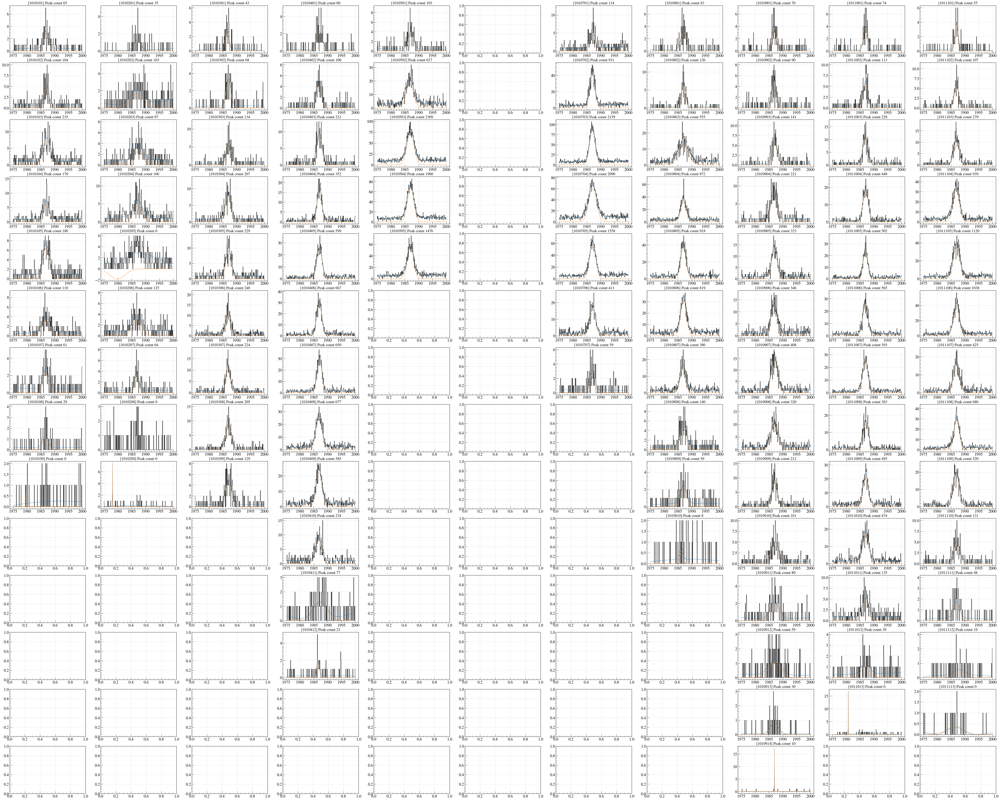

In [37]:
# get gamma peak counts
fig, ax = plt.subplots(14,11, figsize=(70,55), sharex=False, sharey=False)
geds = df_gamma['mage_id'].unique()
def get_gamma_peak_counts(df, scaled_Co_primaries, geds, peak, plot=True, bkg_density_df=None):
    # print('geds', geds)
    d = df[df['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
    b_mids = (b[1:] + b[:-1])/2
    if plot:
        ged_str = str(geds[0])
        row = int(ged_str[5:7])-1
        col = int(ged_str[3:5])-1
        ax[row, col].plot(b_mids, h, ds='steps', lw=1, color='k')
        fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[row, col], lw=1)
        # if geds[0]==1010104:
        #     print(fit_params)
    else:
        fit_params = lu.fit_peak_binned_extra_basic(b_mids, h)
    if fit_params['area'] is None:
        peak_count = 0
    else:
        peak_count = fit_params['area'] if ((fit_params['popt'][1] > peak['peak_range'][0]) & (fit_params['popt'][1] < peak['peak_range'][1]) & (fit_params['area']>0) & (fit_params['fwhm']<6.0)) else 0
    if plot:
        ax[row, col].set_title(str(geds) + ' Peak count ' + str(round(peak_count)))
    if geds[0]==1010803:
        print(peak_count)

    bkg_density = bkg_density_df[bkg_density_df['mage_id']==geds[0]]['bkg_density'].values[0] if bkg_density_df is not None else None
    # print(bkg_density)
    if bkg_density is not None:
        # print(scaled_Co_primaries)
        # if geds[0]==1010104:
        #     print(peak_count, bkg_density, scaled_Co_primaries, peak['peak_range'])
        N = peak_count + bkg_density*scaled_Co_primaries*(peak['peak_range'][1]-peak['peak_range'][0])
        # print(N)
        B = bkg_density*scaled_Co_primaries*(peak['sidebands'][1][1]-peak['sidebands'][1][0]+ peak['sidebands'][0][1]-peak['sidebands'][0][0])
        # print(B)
        if geds[0]==1011013:
            print(N,B)
        return (N,B)
# def get_scaled_Co_primaries(df_full_Co, primaries_full_Co, df_gamma, peak):
#     h,b,v = pgh.get_hist(df_full_Co['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
#     b_mids = (b[1:] + b[:-1])/2
#     peak_count_full_Co = lu.fit_peak_binned_extra_basic(b_mids, h)['area']
#     h,b,v = pgh.get_hist(df_gamma['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
#     b_mids = (b[1:] + b[:-1])/2
#     peak_count_gamma = lu.fit_peak_binned_extra_basic(b_mids, h)['area']
#     return primaries_full_Co/peak_count_full_Co*peak_count_gamma
# scaled_Co_primaries = get_scaled_Co_primaries(df_full_Co, primaries_full_Co, df_gamma, peaks['3009'])
branching_ratio_of_3009_gamma = 0.01036
scaled_Co_primaries = primaries_gamma/branching_ratio_of_3009_gamma
print(scaled_Co_primaries)
peak_counts = []
for ged in geds:
    peak_counts.append(get_gamma_peak_counts(df_gamma, scaled_Co_primaries, [ged], peaks['1987'], bkg_density_df=bkg_density_df))
peak_counts_df = pd.DataFrame({'mage_id': geds, 'peak_counts': peak_counts})
# fig.savefig(results_dir+'1987_spectra_from_gamma_each_det.png')
fig.savefig(results_dir+'1987_spectra_from_gamma_each_det.png')
peak_counts_df
# peak_counts_map = get_param_map(peak_counts_df, param='peak_counts', id='mage_id')
# peak_counts_map

In [38]:
def get_rel_unc(NB, peak=peaks['1987']):
    tau = (peak['sidebands'][1][0]-peak['sidebands'][0][1])/(peak['sidebands'][1][1]-peak['sidebands'][1][0]+peak['sidebands'][0][1]-peak['sidebands'][0][0])
    epsilon = 0.86
    N = NB[0]
    B = NB[1]
    
    N_c = N*epsilon
    B_c = B*epsilon
    t1 = (N+tau**2*B)/((N-tau*B)**2)
    t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
    t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
    rel_unc_sqrd =  t1 + t2 - t3
    rel_unc = np.sqrt(rel_unc_sqrd)
    # print(N, B, tau, N_c, B_c, t1, t2, t3, rel_unc_sqrd, rel_unc)
    return rel_unc
peak_counts_df['survival_frac_unc']  = peak_counts_df['peak_counts'].apply(get_rel_unc)
peak_counts_df

,mage_id,peak_counts,survival_frac_unc
0,1010104,"(3920.52197748236, 7969.963323840407)",0.179009
1,1011005,"(4627.61118247545, 8766.959656224444)",0.065145
2,1011105,"(10996.25374728199, 20987.57008611307)",0.045068
3,1010905,"(3865.5362734749297, 7527.18758362705)",0.092817
4,1011004,"(2864.8852516129928, 5136.198586474929)",0.056995
...,...,...,...
96,1010913,"(154.98156790107146, 265.6654441280136)",0.196904
97,1010707,"(1017.0537432491791, 2036.7684049814375)",0.263927
98,1010810,"(174.92262218250806, 354.2205921706847)",0.780294
99,1010209,"(500.0761301233197, 1062.6617765120543)",NaN


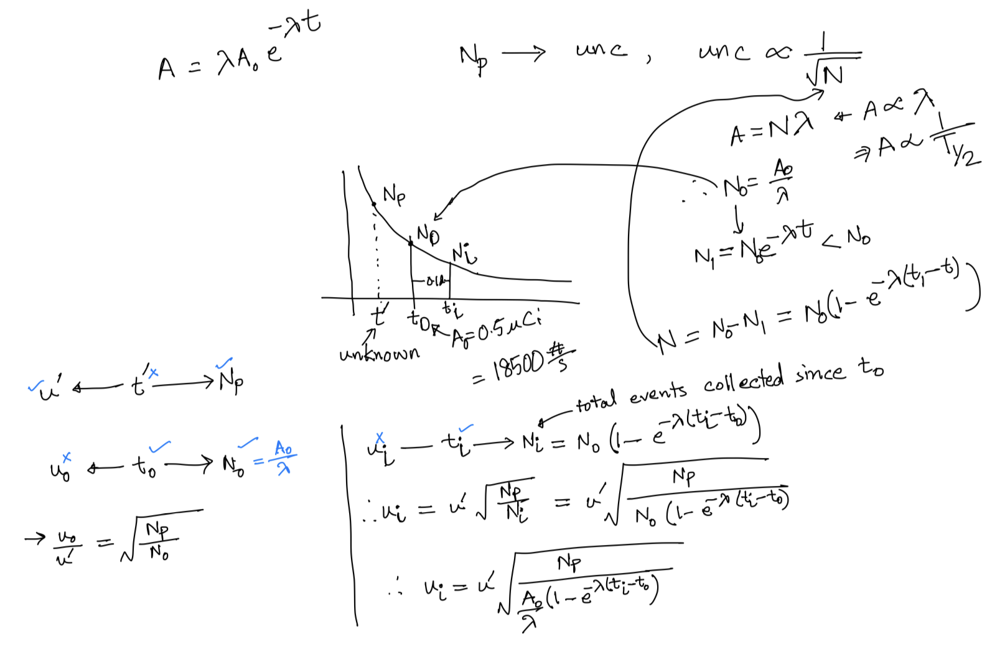

In [40]:
days_elapsed = np.arange(1, 15, 0.1)
def get_survival_frac_unc_over_time(unc, Co_primaries=None, days_elapsed=days_elapsed):
    source_activity_uCi = 0.5 #uCi
    source_activity_Bq = source_activity_uCi*3.7e4 #Bq

    half_life = 77.236 # days
    decay_constant = np.log(2)/half_life # 1/s

    uncs = []
    for d in days_elapsed:
        N = source_activity_Bq*86400/decay_constant*(1-np.exp(-decay_constant*d))
        uncertainty = unc*np.sqrt(Co_primaries/N)
        uncs.append(uncertainty)
    return uncs


peak_counts_df['unc_over_time'] = peak_counts_df['survival_frac_unc'].apply(get_survival_frac_unc_over_time, Co_primaries=scaled_Co_primaries)
peak_counts_df  

,mage_id,peak_counts,survival_frac_unc,unc_over_time
0,1010104,"(3920.52197748236, 7969.963323840407)",0.179009,"[0.20687534741078023, 0.19729209440679385, 0.1..."
1,1011005,"(4627.61118247545, 8766.959656224444)",0.065145,"[0.07528553590979652, 0.0717980235155252, 0.06..."
2,1011105,"(10996.25374728199, 20987.57008611307)",0.045068,"[0.05208363798597593, 0.04967092575885614, 0.0..."
3,1010905,"(3865.5362734749297, 7527.18758362705)",0.092817,"[0.10726568382245924, 0.10229672933086828, 0.0..."
4,1011004,"(2864.8852516129928, 5136.198586474929)",0.056995,"[0.06586741622487687, 0.06281618695903067, 0.0..."
...,...,...,...,...
96,1010913,"(154.98156790107146, 265.6654441280136)",0.196904,"[0.22755575970856273, 0.21701451134284347, 0.2..."
97,1010707,"(1017.0537432491791, 2036.7684049814375)",0.263927,"[0.3050127245819329, 0.29088337497267364, 0.27..."
98,1010810,"(174.92262218250806, 354.2205921706847)",0.780294,"[0.9017621531518525, 0.8599891000972796, 0.823..."
99,1010209,"(500.0761301233197, 1062.6617765120543)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."


In [41]:
peak_counts_df['det_name'] = peak_counts_df['mage_id'].apply(lambda x : lu.get_det_id_from_mage_id(x))
peak_counts_df

,mage_id,peak_counts,survival_frac_unc,unc_over_time,det_name
0,1010104,"(3920.52197748236, 7969.963323840407)",0.179009,"[0.20687534741078023, 0.19729209440679385, 0.1...",V05266A
1,1011005,"(4627.61118247545, 8766.959656224444)",0.065145,"[0.07528553590979652, 0.0717980235155252, 0.06...",B00035A
2,1011105,"(10996.25374728199, 20987.57008611307)",0.045068,"[0.05208363798597593, 0.04967092575885614, 0.0...",P00573B
3,1010905,"(3865.5362734749297, 7527.18758362705)",0.092817,"[0.10726568382245924, 0.10229672933086828, 0.0...",P00537A
4,1011004,"(2864.8852516129928, 5136.198586474929)",0.056995,"[0.06586741622487687, 0.06281618695903067, 0.0...",B00032D
...,...,...,...,...,...
96,1010913,"(154.98156790107146, 265.6654441280136)",0.196904,"[0.22755575970856273, 0.21701451134284347, 0.2...",P00909B
97,1010707,"(1017.0537432491791, 2036.7684049814375)",0.263927,"[0.3050127245819329, 0.29088337497267364, 0.27...",V07302B
98,1010810,"(174.92262218250806, 354.2205921706847)",0.780294,"[0.9017621531518525, 0.8599891000972796, 0.823...",V07302A
99,1010209,"(500.0761301233197, 1062.6617765120543)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",V07298B


In [43]:
unc_5 = []
unc_10 = []
for i,row in peak_counts_df.iterrows():
    unc_5.append(row['unc_over_time'][40])
    unc_10.append(row['unc_over_time'][90])
peak_counts_df['unc_5'] = unc_5
peak_counts_df['unc_10'] = unc_10

In [ ]:
# take average of unc_5 of all det_name that starts with V
peak_counts_df = peak_counts_df[peak_counts_df['unc_5']<=1]

unc_5_V = peak_counts_df[peak_counts_df['det_name'].str.startswith('V')]['unc_5'].mean()
unc_5_B = peak_counts_df[peak_counts_df['det_name'].str.startswith('B')]['unc_5'].mean()
unc_5_C = peak_counts_df[peak_counts_df['det_name'].str.startswith('C')]['unc_5'].mean()
unc_5_P = peak_counts_df[peak_counts_df['det_name'].str.startswith('P')]['unc_5'].mean()

unc_10_V = peak_counts_df[peak_counts_df['det_name'].str.startswith('V')]['unc_10'].mean()
unc_10_B = peak_counts_df[peak_counts_df['det_name'].str.startswith('B')]['unc_10'].mean()
unc_10_C = peak_counts_df[peak_counts_df['det_name'].str.startswith('C')]['unc_10'].mean()
unc_10_P = peak_counts_df[peak_counts_df['det_name'].str.startswith('P')]['unc_10'].mean()
# create dataframe with these as columns
# unc_avg_df = pd.DataFrame({'Det Type':['V','B','C','P'], 'Avg unc after 20 days\n0.5uCi':[unc_5_V, unc_5_B, unc_5_C, unc_5_P], 'Avg unc after 40 days\n0.5uCi':[unc_10_V, unc_10_B, unc_10_C, unc_10_P]})
unc_avg_df = pd.DataFrame({'Det Type':['V','B','C','P'], 'Avg unc after 20 days (0.5uCi)':[unc_5_V, unc_5_B, unc_5_C, unc_10_P],  'Avg unc after 40 days (0.5uCi)':[unc_10_V, unc_10_B, unc_10_C, unc_10_P]})
unc_avg_df

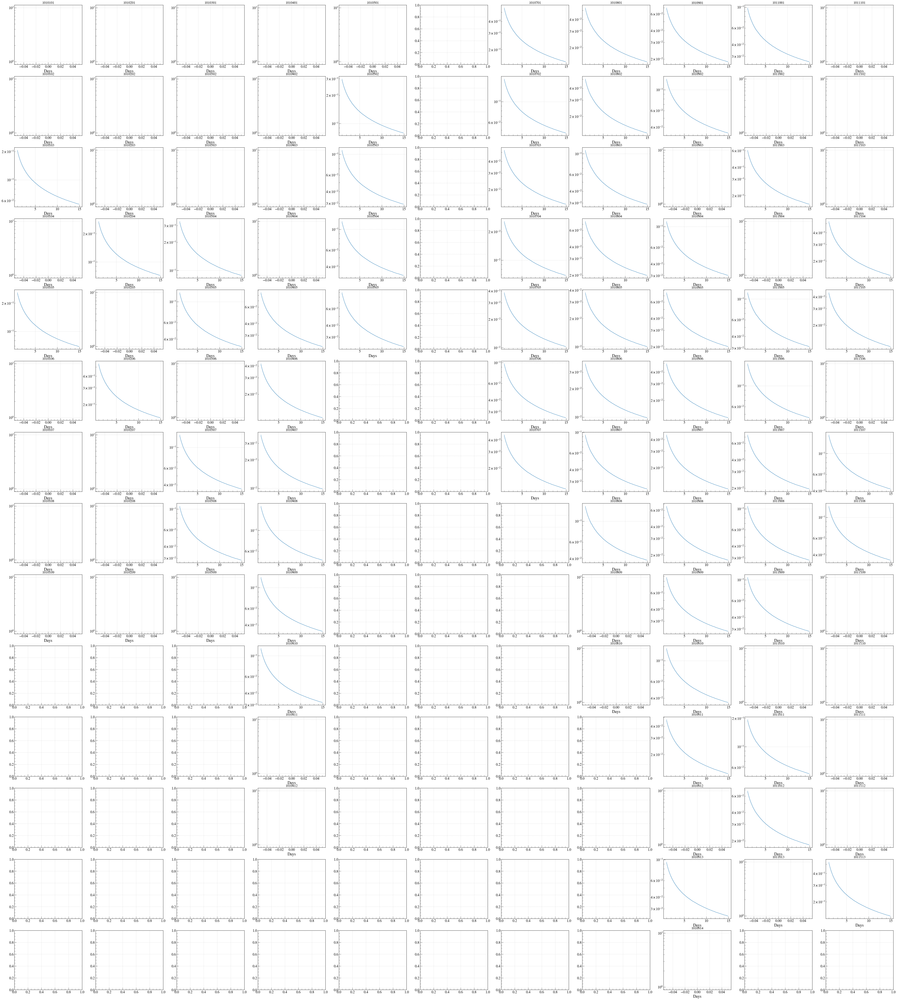

In [27]:
fig, ax = plt.subplots(14,11, figsize=(70,77))
for i,row in peak_counts_df.iterrows():
    ged_str = str(row['mage_id'])
    r = int(ged_str[5:7])-1
    c = int(ged_str[3:5])-1
    ax[r, c].plot(days_elapsed, row['unc_over_time'], ds='steps', lw=1)
    ax[r, c].set_yscale('log')
    ax[r, c].set_title(ged_str)
    ax[r, c].set_xlabel('Days')
    # ax[r, c].set_ylabel('unc. on DEP survival fraction')
# fig.savefig(results_dir+'1987_unc_over_time_source_at_all_pos_05uCi.png')
fig.savefig(results_dir+'1987_unc_over_time_source_at_sis2_pos3_05uCi.png')

In [93]:
scaled_Co_primaries

2125225965.2509654

In [28]:
print(scaled_Co_primaries)
peak = peaks['1987']
Ns_on_5th_day = []
Ns_on_10th_day = []
Bs_on_5th_day = []
Bs_on_10th_day = []
uncs_on_5th_day = []
uncs_on_10th_day = []
for _,row in peak_counts_df.iterrows():
    # print(row)
    Nsim = row['peak_counts'][0]
    Bsim = row['peak_counts'][1]
    # print(Nsim, Bsim)
    bkg_density = bkg_density_df[bkg_density_df['mage_id']==row['mage_id']]['bkg_density'].values[0]
    peak_range = peak['peak_range'][1]-peak['peak_range'][0]
    Csim = Nsim - bkg_density*peak_range*scaled_Co_primaries
    source_activity_uCi = 0.5 #uCi
    source_activity_Bq = source_activity_uCi*3.7e4 #Bq
    half_life = 77.236 # days
    decay_const = np.log(2)/half_life
    for d in [5, 10]:
        Co = source_activity_Bq*86400/decay_const*(1-np.exp(-decay_const*d))
        C = Csim/scaled_Co_primaries*Co
        N = C + bkg_density*peak_range*Co
        B = bkg_density*(peak['sidebands'][0][1]-peak['sidebands'][0][0]+peak['sidebands'][1][1]-peak['sidebands'][1][0])*Co
        unc = get_rel_unc([N,B], peak)
        if d == 5:
            Ns_on_5th_day.append(N)
            Bs_on_5th_day.append(B)
            uncs_on_5th_day.append(unc)
        elif d==10:
            Ns_on_10th_day.append(N)
            Bs_on_10th_day.append(B)
            uncs_on_10th_day.append(unc)
peak_counts_df['N_5'] = Ns_on_5th_day
peak_counts_df['B_5'] = Bs_on_5th_day
peak_counts_df['unc_5'] = uncs_on_5th_day
peak_counts_df['N_10'] = Ns_on_10th_day
peak_counts_df['B_10'] = Bs_on_10th_day
peak_counts_df['unc_10'] = uncs_on_10th_day
peak_counts_df


193026640.92664093


/tmp/ipykernel_2060577/2128925174.py:10: RuntimeWarning: divide by zero encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_2060577/2128925174.py:11: RuntimeWarning: divide by zero encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
/tmp/ipykernel_2060577/2128925174.py:12: RuntimeWarning: invalid value encountered in scalar subtract
  rel_unc_sqrd =  t1 + t2 - t3
/tmp/ipykernel_2060577/2128925174.py:9: RuntimeWarning: divide by zero encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_2060577/2128925174.py:9: RuntimeWarning: invalid value encountered in scalar divide
  t1 = (N+tau**2*B)/((N-tau*B)**2)
/tmp/ipykernel_2060577/2128925174.py:10: RuntimeWarning: invalid value encountered in scalar divide
  t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
/tmp/ipykernel_2060577/2128925174.py:11: RuntimeWarning: invalid value encountered in scalar divide
  t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)


,mage_id,peak_counts,survival_frac_unc,unc_over_time,N_5,B_5,unc_5,N_10,B_10,unc_10
0,1010703,"(1816.9106834108889, 3571.1732013895266)",0.151101,"[0.05262662808941854, 0.05018876249528292, 0.0...",7.356384e+04,1.445912e+05,2.374655e-02,1.438997e+05,2.828376e+05,1.697864e-02
1,1010704,"(29605.20254707861, 60516.908034357664)",0.074266,"[0.025866121519325783, 0.024667904381063525, 0...",1.198668e+06,2.450234e+06,1.167149e-02,2.344738e+06,4.792951e+06,8.345044e-03
2,1010805,"(5367.793948250574, 10713.519604168581)",0.108841,"[0.03790821606451612, 0.036152163301232124, 0....",2.173335e+05,4.337735e+05,1.710521e-02,4.251304e+05,8.485129e+05,1.223012e-02
3,1010502,"(235.82002045896843, 482.59097316074696)",0.856703,"[0.29838008439529035, 0.28455798390869624, 0.2...",9.547980e+03,1.953935e+04,1.346371e-01,1.867699e+04,3.822130e+04,9.626472e-02
4,1010806,"(4812.958360965575, 9555.301268582787)",0.106167,"[0.036976655292320706, 0.03526375596747328, 0....",1.948691e+05,3.868790e+05,1.668486e-02,3.811873e+05,7.567818e+05,1.192957e-02
...,...,...,...,...,...,...,...,...,...,...
96,1010914,"(45.42032688571736, 96.51819463214939)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1.838997e+03,3.907869e+03,8.557756e+13,3.597299e+03,7.644260e+03,5.984497e+13
97,1010801,"(6.940319161113499, 0.0)",0.153153,"[0.05334142542390797, 0.05087044769829452, 0.0...",2.810026e+02,0.000000e+00,2.406909e-02,5.496747e+02,0.000000e+00,1.720925e-02
98,1010901,"(4.012603506990355, 0.0)",0.201420,"[0.07015218689890795, 0.06690247075704087, 0.0...",1.624640e+02,0.000000e+00,3.165456e-02,3.177990e+02,0.000000e+00,2.263281e-02
99,1010403,"(45.42032688571736, 96.51819463214939)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1.838997e+03,3.907869e+03,8.557756e+13,3.597299e+03,7.644260e+03,5.984497e+13


In [29]:
peak_counts_df['det_name'] = peak_counts_df['mage_id'].apply(lambda x : lu.get_det_id_from_mage_id(x))
peak_counts_df

,mage_id,peak_counts,survival_frac_unc,unc_over_time,N_5,B_5,unc_5,N_10,B_10,unc_10,det_name
0,1010703,"(1816.9106834108889, 3571.1732013895266)",0.151101,"[0.05262662808941854, 0.05018876249528292, 0.0...",7.356384e+04,1.445912e+05,2.374655e-02,1.438997e+05,2.828376e+05,1.697864e-02,V04199A
1,1010704,"(29605.20254707861, 60516.908034357664)",0.074266,"[0.025866121519325783, 0.024667904381063525, 0...",1.198668e+06,2.450234e+06,1.167149e-02,2.344738e+06,4.792951e+06,8.345044e-03,V04545A
2,1010805,"(5367.793948250574, 10713.519604168581)",0.108841,"[0.03790821606451612, 0.036152163301232124, 0....",2.173335e+05,4.337735e+05,1.710521e-02,4.251304e+05,8.485129e+05,1.223012e-02,V00050A
3,1010502,"(235.82002045896843, 482.59097316074696)",0.856703,"[0.29838008439529035, 0.28455798390869624, 0.2...",9.547980e+03,1.953935e+04,1.346371e-01,1.867699e+04,3.822130e+04,9.626472e-02,V08682A
4,1010806,"(4812.958360965575, 9555.301268582787)",0.106167,"[0.036976655292320706, 0.03526375596747328, 0....",1.948691e+05,3.868790e+05,1.668486e-02,3.811873e+05,7.567818e+05,1.192957e-02,V00050B
...,...,...,...,...,...,...,...,...,...,...,...
96,1010914,"(45.42032688571736, 96.51819463214939)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1.838997e+03,3.907869e+03,8.557756e+13,3.597299e+03,7.644260e+03,5.984497e+13,B00091B
97,1010801,"(6.940319161113499, 0.0)",0.153153,"[0.05334142542390797, 0.05087044769829452, 0.0...",2.810026e+02,0.000000e+00,2.406909e-02,5.496747e+02,0.000000e+00,1.720925e-02,B00089C
98,1010901,"(4.012603506990355, 0.0)",0.201420,"[0.07015218689890795, 0.06690247075704087, 0.0...",1.624640e+02,0.000000e+00,3.165456e-02,3.177990e+02,0.000000e+00,2.263281e-02,B00002A
99,1010403,"(45.42032688571736, 96.51819463214939)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1.838997e+03,3.907869e+03,8.557756e+13,3.597299e+03,7.644260e+03,5.984497e+13,B00061A


In [116]:
peak_counts_df[peak_counts_df['unc_5']<=0.03].shape

(14, 11)

In [30]:
dt = lu.get_det_type_map()
# convert s to S in column names
dt.columns = [col.replace('s', 'S') for col in dt.columns]
dt

,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,V,B,B,B,V,V,B,B,B,B
2,V,C,B,B,V,V,B,B,B,B
3,V,C,P,B,V,V,C,B,B,B
4,V,C,P,B,V,V,V,B,B,P
5,V,C,P,B,V,V,V,P,B,P
6,V,C,P,B,NaN,V,V,P,B,P
7,V,V,P,B,NaN,V,V,P,B,P
8,V,V,P,V,NaN,NaN,V,P,B,P
9,V,V,P,V,NaN,NaN,V,P,V,P
10,NaN,NaN,NaN,V,NaN,NaN,V,P,V,P


In [31]:
unc_map = get_param_map(peak_counts_df, param='unc_10', id='mage_id')
um = (unc_map).round(3)
# convert all >1 values to Nan
um[um>1] = np.nan
# convert um to str
um = um.astype(str)
# remove spaces from column names
# um.columns = um.columns.str.replace(' ', '_')
for col in um.columns:
    for row in um.index:
        # print(type(row), type(col), um[col][row])
        if um[col][row] == 'nan':
            um[col][row] = ''
        else:
            um[col][row] = dt[col][row]+':'+um[col][row]
um

,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,,,,,,V:0.18,B:0.017,B:0.023,B:0.032,
2,,,,,V:0.096,V:0.056,B:0.016,B:0.042,,
3,V:0.067,,,,V:0.036,V:0.017,C:0.035,,B:0.196,
4,,C:0.087,P:0.108,,V:0.039,V:0.008,V:0.024,B:0.037,,P:0.171
5,V:0.084,,P:0.04,B:0.028,V:0.029,V:0.012,V:0.012,P:0.024,B:0.038,P:0.014
6,,C:0.175,,B:0.014,,V:0.031,V:0.012,P:0.016,B:0.056,
7,,,P:0.044,B:0.012,,V:0.015,V:0.03,P:0.014,B:0.024,P:0.051
8,,,P:0.035,V:0.059,,,V:0.047,P:0.021,B:0.035,P:0.043
9,,,,V:0.042,,,,P:0.028,V:0.034,
10,,,,V:0.039,,,,P:0.044,,


In [102]:
peak_counts_df[['mage_id', 'det_name', 'N_5','B_5','unc_5','N_10','B_10','unc_10']].to_csv(results_dir+'1987_peak_counts_DEP_unc_5th_10th_05uCi.csv')

In [ ]:
# delete row of peak_counts_df if unc_5 or unc_10 > 1


In [33]:
# take average of unc_5 of all det_name that starts with V
peak_counts_df = peak_counts_df[peak_counts_df['unc_5']<=1]

unc_10_V = peak_counts_df[peak_counts_df['det_name'].str.startswith('V')]['unc_10'].mean()
unc_10_B = peak_counts_df[peak_counts_df['det_name'].str.startswith('B')]['unc_10'].mean()
unc_10_C = peak_counts_df[peak_counts_df['det_name'].str.startswith('C')]['unc_10'].mean()
unc_10_P = peak_counts_df[peak_counts_df['det_name'].str.startswith('P')]['unc_10'].mean()
# create dataframe with these as columns
# unc_avg_df = pd.DataFrame({'Det Type':['V','B','C','P'], 'Avg unc after 20 days\n0.5uCi':[unc_5_V, unc_5_B, unc_5_C, unc_5_P], 'Avg unc after 40 days\n0.5uCi':[unc_10_V, unc_10_B, unc_10_C, unc_10_P]})
unc_avg_df = pd.DataFrame({'Det Type':['V','B','C','P'], 'Avg unc after 40 days (0.5uCi)':[unc_10_V, unc_10_B, unc_10_C, unc_10_P]})
unc_avg_df

,Det Type,Avg unc after 40 days (0.5uCi)
0,V,0.043916
1,B,0.040565
2,C,0.099265
3,P,0.051188


In [125]:
# take average of unc_5 of all det_name that starts with V
peak_counts_df = peak_counts_df[peak_counts_df['unc_5']<=1]
unc_5_V = peak_counts_df[peak_counts_df['det_name'].str.startswith('V')]['unc_5'].mean()
unc_5_B = peak_counts_df[peak_counts_df['det_name'].str.startswith('B')]['unc_5'].mean()
unc_5_C = peak_counts_df[peak_counts_df['det_name'].str.startswith('C')]['unc_5'].mean()
unc_5_P = peak_counts_df[peak_counts_df['det_name'].str.startswith('P')]['unc_5'].mean()
unc_10_V = peak_counts_df[peak_counts_df['det_name'].str.startswith('V')]['unc_10'].mean()
unc_10_B = peak_counts_df[peak_counts_df['det_name'].str.startswith('B')]['unc_10'].mean()
unc_10_C = peak_counts_df[peak_counts_df['det_name'].str.startswith('C')]['unc_10'].mean()
unc_10_P = peak_counts_df[peak_counts_df['det_name'].str.startswith('P')]['unc_10'].mean()
# create dataframe with these as columns
# unc_avg_df = pd.DataFrame({'Det Type':['V','B','C','P'], 'Avg unc after 20 days\n0.5uCi':[unc_5_V, unc_5_B, unc_5_C, unc_5_P], 'Avg unc after 40 days\n0.5uCi':[unc_10_V, unc_10_B, unc_10_C, unc_10_P]})
unc_avg_df['Avg unc after 20 days\n0.25uCi'] = [unc_5_V, unc_5_B, unc_5_C, unc_5_P]
unc_avg_df['Avg unc after 40 days\n0.25uCi'] = [unc_10_V, unc_10_B, unc_10_C, unc_10_P]
unc_avg_df

,Det Type,Avg unc after 20 days\n0.5uCi,Avg unc after 40 days\n0.5uCi,Avg unc after 20 days\n0.25uCi,Avg unc after 40 days\n0.25uCi
0,V,0.088225,0.063080,0.088225,0.063080
1,B,0.072154,0.051590,0.072154,0.051590
2,C,0.092625,0.066226,0.092625,0.066226
3,P,0.062064,0.044375,0.062064,0.044375


In [126]:
unc_avg_df.to_csv(results_dir+'unc_avg_by_det_type.csv')

In [43]:
# def unc_from_N_B(N, B, peak=peaks['1987']):
#     tau = (peak['sidebands'][1][0]-peak['sidebands'][0][1])/(peak['sidebands'][1][1]-peak['sidebands'][1][0]+peak['sidebands'][0][1]-peak['sidebands'][0][0])
#     epsilon = 0.86
#     N_c = N*epsilon
#     B_c = B*epsilon
#     t1 = (N+tau**2*B)/((N-tau*B)**2)
#     t2 = (N_c+tau**2*B_c)/((N_c-tau*B_c)**2)
#     t3 = 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
#     rel_unc_sqrd =  t1 + t2 - t3
#     rel_unc = np.sqrt(rel_unc_sqrd)
#     return rel_unc
# peak_counts_df['unc_5'] = peak_counts_df.apply(lambda row: unc_from_N_B(row['N_5'], row['B_5']), axis=1)
# peak_counts_df['unc_10'] = peak_counts_df.apply(lambda row: unc_from_N_B(row['N_10'], row['B_10']), axis=1)
# peak_counts_df

In [44]:
peak_counts_df['det_name'] = peak_counts_df['mage_id'].apply(lambda x : lu.get_det_id_from_mage_id(x))
peak_counts_df

,mage_id,peak_counts,survival_frac_unc,unc_over_time,N_5,B_5,unc_5,N_10,B_10,unc_10,det_name
0,1010104,"(3920.52197748236, 7969.963323840407)",0.179009,"[0.20687534741078023, 0.19729209440679385, 0.1...",15859.136523,32239.772449,8.900357e-02,31022.371458,63064.858240,6.363700e-02,V05266A
1,1011005,"(4627.61118247545, 8766.959656224444)",0.065145,"[0.07528553590979652, 0.0717980235155252, 0.06...",18719.425102,35463.749693,3.238995e-02,36617.438670,69371.344064,2.315861e-02,B00035A
2,1011105,"(10996.25374728199, 20987.57008611307)",0.045068,"[0.05208363798597593, 0.04967092575885614, 0.0...",44481.599751,84898.067448,2.240784e-02,87011.339396,166070.793366,1.602147e-02,P00573B
3,1010905,"(3865.5362734749297, 7527.18758362705)",0.092817,"[0.10726568382245924, 0.10229672933086828, 0.0...",15636.710583,30448.673979,4.614870e-02,30587.279665,59561.255005,3.299604e-02,P00537A
4,1011004,"(2864.8852516129928, 5136.198586474929)",0.056995,"[0.06586741622487687, 0.06281618695903067, 0.0...",11588.917646,20776.742245,2.833801e-02,22669.311630,40641.797533,2.026150e-02,B00032D
...,...,...,...,...,...,...,...,...,...,...,...
96,1010913,"(154.98156790107146, 265.6654441280136)",0.196904,"[0.22755575970856273, 0.21701451134284347, 0.2...",626.925154,1074.659082,9.790087e-02,1226.340726,2102.161941,6.999851e-02,P00909B
97,1010707,"(1017.0537432491791, 2036.7684049814375)",0.263927,"[0.3050127245819329, 0.29088337497267364, 0.27...",4114.144560,8239.052959,1.312250e-01,8047.759762,16116.574884,9.382508e-02,V07302B
98,1010810,"(174.92262218250806, 354.2205921706847)",0.780294,"[0.9017621531518525, 0.8599891000972796, 0.823...",707.589898,1432.878775,3.879634e-01,1384.130632,2802.882588,2.773914e-01,V07302A
99,1010209,"(500.0761301233197, 1062.6617765120543)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",2022.887683,4298.636326,8.975430e+13,3957.010713,8408.647765,6.276579e+13,V07298B


In [45]:
peak_counts_df[['mage_id','N_5','B_5','unc_on_5th_day','N_10','B_10','unc_on_10th_day']].to_csv(results_dir+'counts_on_5th_10th_day.csv')

KeyError: "['unc_on_5th_day', 'unc_on_10th_day'] not in index"

In [ ]:
# def get_peak_info_on_ith_day(unc_sim, Co_primaries=scaled_Co_primaries, i_day=5, source_activity_uCi=0.5, half_life_days=77.2):
#     decay_const = np.log(2)/half_life_days
#     # print(Co_primaries)
#     unc = unc_sim*np.sqrt(Co_primaries/(source_activity_uCi*3.7e4*86400/decay_const*(1-np.exp(-decay_const*i_day))))
#     #unc = unc_sim*np.sqrt(Co_primaries/(source_activity_uCi*37000*86400*i_day))
#     return unc

# peak_counts_df['unc_on_5th_day'] = peak_counts_df['survival_frac_unc'].apply(lambda x: get_peak_info_on_ith_day(x, i_day=5))
# peak_counts_df['unc_on_10th_day'] = peak_counts_df['survival_frac_unc'].apply(lambda x: get_peak_info_on_ith_day(x, i_day=10))
# peak_counts_df

,mage_id,peak_counts,survival_frac_unc,unc_over_time,N_5,B_5,unc_5,N_10,B_10,unc_10,unc_on_5th_day,unc_on_10th_day
0,1010104,"(3920.8785900088806, 7969.963323840407)",0.178640,"[0.20644863879997563, 0.19688515256195485, 0.1...",14418.708252,29308.884044,0.093155,28204.721152,57331.689309,0.066605,0.093156,0.066606
1,1011005,"(4626.601908328599, 8766.959656224444)",0.065271,"[0.07543141268265825, 0.07193714272138228, 0.0...",17013.947661,32239.772449,0.034037,33281.320426,63064.858240,0.024336,0.034037,0.024336
2,1011105,"(10994.215381016338, 20987.57008611307)",0.045147,"[0.052175223229205515, 0.04975826842524762, 0....",40430.322031,77180.061316,0.023543,79086.554707,150973.448515,0.016833,0.023543,0.016833
3,1010905,"(3866.756235641357, 7527.18758362705)",0.092478,"[0.10687426101589934, 0.10192343871760132, 0.0...",14219.677749,27680.612708,0.048225,27815.393639,54146.595459,0.034480,0.048225,0.034481
4,1011004,"(2865.0269870335487, 5136.198586474929)",0.056978,"[0.0658477430652218, 0.06279742513496353, 0.06...",10535.900899,18887.947495,0.029712,20609.484688,36947.088666,0.021244,0.029712,0.021244
...,...,...,...,...,...,...,...,...,...,...,...,...
96,1010913,"(155.07777678259103, 265.6654441280136)",0.196318,"[0.2268784495404143, 0.2163685767580344, 0.207...",570.285758,976.962801,0.102374,1115.547281,1911.056310,0.073197,0.102374,0.073197
97,1010707,"(1016.7367981380887, 2036.7684049814375)",0.265335,"[0.3066390145660327, 0.29243432901863226, 0.28...",3738.965878,7490.048145,0.138364,7313.865303,14651.431712,0.098929,0.138365,0.098930
98,1010810,"(175.25218252019414, 354.2205921706847)",0.750741,"[0.8676085508138934, 0.8274176225330002, 0.792...",644.475475,1302.617069,0.391488,1260.671257,2548.075080,0.279912,0.391490,0.279915
99,1010209,"(500.0761301233197, 1062.6617765120543)",NaN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",1838.988803,3907.851206,NaN,3597.282466,7644.225241,NaN,NaN,NaN


In [ ]:
# peak_counts_df to csv
peak_counts_df.to_csv(results_dir+'peak_counts_df_025uCi.csv')

In [ ]:
# save the ax
fig.savefig(results_dir + 'survival_unc_over_time_eps086_all_ged_025uCi.png')

# Event rate

In [ ]:
scaled_Co_primaries

2125225965.2509654

In [130]:
event_rate_map

,string 1,string 2,string 3,string 4,string 5,string 7,string 8,string 9,string 10,string 11
1,61.415883,19.016561,23.057455,27.110682,65.708850,132.836099,34.028458,28.322488,37.390988,25.698451
2,113.469564,74.341038,34.513335,56.863903,456.190863,578.119170,49.586131,41.067261,61.713438,57.107497
3,199.985704,118.747702,67.837219,94.257203,1441.688718,1199.157228,371.385282,72.063121,103.021210,91.751109
4,198.772356,176.794118,94.206326,147.747013,1103.022189,1305.382939,536.661079,113.848832,170.294153,382.875080
5,170.388199,179.283253,139.124076,230.858225,926.461644,848.008021,567.728631,204.448263,219.734589,494.418244
6,110.627371,133.261619,135.939617,241.957193,NaN,288.754321,519.122274,243.836571,275.431397,547.612040
7,68.332888,59.184218,129.049592,273.675358,NaN,56.880091,253.625833,250.379705,276.348731,437.287620
8,27.921636,27.079077,89.184887,351.947056,NaN,NaN,105.742376,183.759688,232.036113,337.852492
9,12.155829,12.886613,64.554089,313.877704,NaN,NaN,44.338057,125.746420,494.862264,198.860235
10,NaN,NaN,NaN,147.194300,NaN,NaN,13.236587,77.914786,334.011253,75.554386


In [135]:
def get_event_rate(Co_df, Co_primaries, source_strength_Bq, threshold=0):
    d = Co_df[Co_df['energy']>threshold]
    cm = lu.get_count_map(d)
    return cm/Co_primaries*source_strength_Bq
source_strength_uCi = 0.25 #uCi
source_strength_Bq = source_strength_uCi*3.7e4 #Bq
event_rate_map = get_event_rate(df_full_Co, primaries_full_Co, source_strength_Bq, threshold=1400)

# event_rate_map.to_csv(results_dir+'event_rate_map_05uCi_1400keV_thresh.csv')

em = event_rate_map.round(1)
em = em.astype(str)
em.columns = [col.replace('s', 'S') for col in em.columns]
for col in em.columns:
    for row in em.index:
        # print(type(row), type(col), um[col][row])
        if em[col][row] == 'nan':
            em[col][row] = ''
        else:
            em[col][row] = dt[col][row]+':'+em[col][row]
em

,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,V:1.4,B:0.3,B:0.5,B:0.5,V:1.3,V:3.2,B:0.6,B:0.5,B:0.7,B:0.4
2,V:2.5,C:1.8,B:0.7,B:1.1,V:15.7,V:20.8,B:0.8,B:0.8,B:1.2,B:0.9
3,V:4.8,C:2.8,P:1.4,B:1.9,V:74.7,V:51.2,C:10.5,B:1.4,B:2.0,B:1.6
4,V:4.6,C:4.3,P:1.9,B:3.0,V:44.7,V:58.5,V:14.9,B:2.3,B:3.5,P:12.0
5,V:3.9,C:4.5,P:3.0,B:5.2,V:34.6,V:36.0,V:16.1,P:4.6,B:4.9,P:14.5
6,V:2.5,C:3.5,P:2.9,B:5.2,,V:8.2,V:14.3,P:5.5,B:5.9,P:16.4
7,V:1.7,V:1.5,P:2.7,B:5.8,,V:1.1,V:6.8,P:5.5,B:5.9,P:12.5
8,V:0.7,V:0.7,P:1.8,V:9.4,,,V:2.6,P:4.0,B:4.5,P:8.8
9,V:0.3,V:0.3,P:1.3,V:8.1,,,V:1.1,P:2.6,V:13.7,P:4.9
10,,,,V:3.4,,,V:0.3,P:1.7,V:9.6,P:1.4


BOTH 0.5 uCi and 0.25 uCi combine table

### Sim from vancouver results

In [3]:
evt_filenames_vancouver = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_vancouver.txt'
df_vanc = pd.DataFrame()
primaries_vanc = 0
primaries = []
bkg_indices = []
with open(evt_filenames_vancouver) as f:
    evt_filenames = f.read().splitlines()
    for evt_filename in evt_filenames:
        ff = ur.open(evt_filename)
        # print(evt_filename, 'opened')
        dets = ff['simTree/mage_id'].array(library='np')
        primaries_vanc += len(dets)
        dets = np.concatenate(dets)
        
        energies = ff['simTree/energy'].array(library='np')
        energies = np.concatenate(energies)
        d = pd.DataFrame({'mage_id': dets, 'energy': energies})
        df_vanc = pd.concat([df_vanc, d], ignore_index=True)
   
print('primaries_vanc', primaries_vanc)
df_vanc['energy'] = df_vanc['energy'].apply(lambda x: x*1000)
df_vanc

primaries_vanc 119994453


,mage_id,energy
0,1010704,144.095972
1,1011102,700.127400
2,1010906,401.827494
3,1010805,434.088314
4,1010806,603.299438
...,...,...
153941950,1011004,162.523602
153941951,1010705,305.416521
153941952,1011102,183.354690
153941953,1010703,3.997480


     mage_id   bkg_density
0    1010704  1.891852e-05
1    1011102  1.715766e-08
2    1010906  3.554086e-07
3    1010805  2.794737e-06
4    1010806  2.488841e-06
..       ...           ...
96   1010109  1.519678e-08
97   1010901  1.176525e-08
98   1010209  1.127503e-08
99   1011101  6.863062e-09
100  1010402  1.813809e-08

[101 rows x 2 columns]


,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,0.03,0.00,0.01,0.01,0.03,0.04,0.01,0.01,0.02,0.01
2,0.05,0.04,0.02,0.02,0.15,0.17,0.01,0.02,0.02,0.02
3,0.09,0.05,0.03,0.03,0.54,1.48,0.20,0.04,0.03,0.02
4,0.11,0.11,0.03,0.03,0.63,18.92,0.77,0.07,0.05,0.05
5,0.09,0.13,0.06,0.04,0.60,2.27,2.79,0.19,0.06,0.07
6,0.06,0.08,0.06,0.05,NaN,0.30,2.49,0.36,0.11,0.09
7,0.05,0.05,0.06,0.08,NaN,0.03,0.44,0.51,0.13,0.07
8,0.02,0.03,0.05,0.14,NaN,NaN,0.12,0.35,0.13,0.06
9,0.02,0.01,0.04,0.12,NaN,NaN,0.05,0.20,0.32,0.04
10,NaN,NaN,NaN,0.08,NaN,NaN,0.01,0.09,0.22,0.03


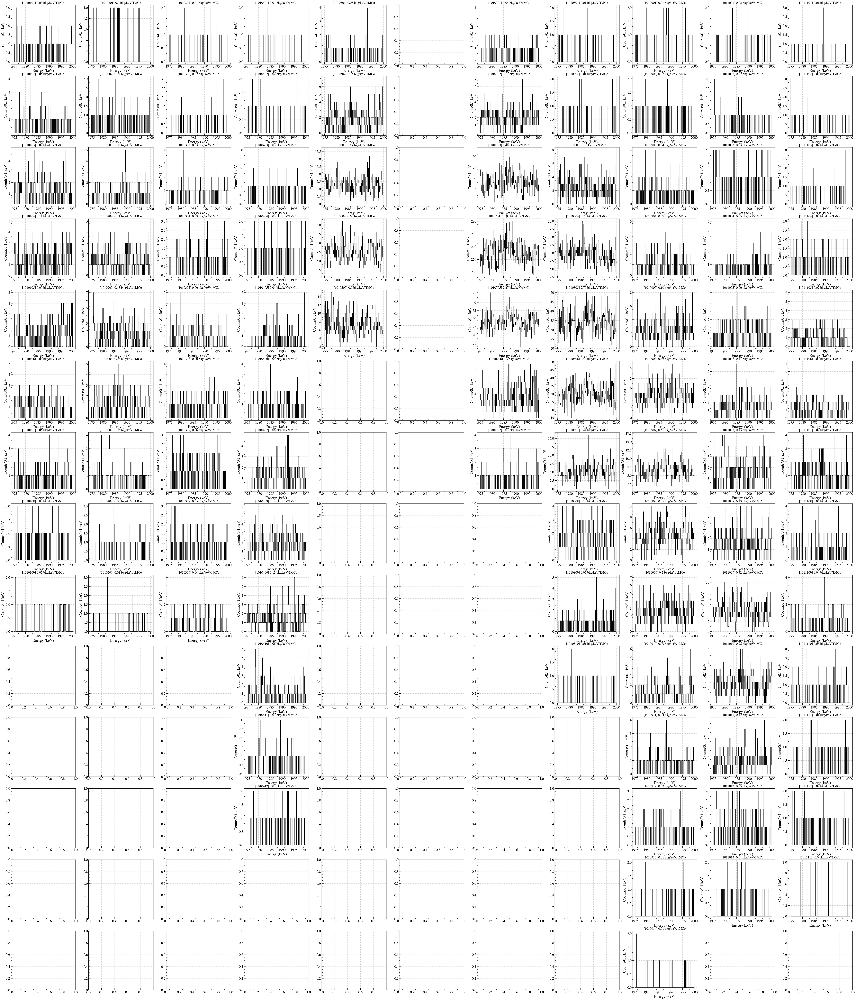

In [36]:
# get bkg_density df
fig, ax = plt.subplots(14,11, figsize=(70,80.5), sharex=False, sharey=False)
geds = df_vanc['mage_id'].unique()
def get_bkg_density(full_Co_df, full_Co_primaries, geds, peak, plot=True):
    
    # print('geds', geds)
    d = full_Co_df[full_Co_df['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
    b_mids = (b[1:] + b[:-1])/2
    # get counts within sidebands regions of the peak
    bkg_bins_left = h[(b_mids > peak['sidebands'][0][0]) & (b_mids < peak['sidebands'][0][1])]
    bkg_bins_right = h[(b_mids > peak['sidebands'][1][0]) & (b_mids < peak['sidebands'][1][1])]
    bkg_region_keV = (peak['sidebands'][0][1] - peak['sidebands'][0][0]) + (peak['sidebands'][1][1] - peak['sidebands'][1][0])
    bkg_density = (np.sum(bkg_bins_left)+np.sum(bkg_bins_right))/bkg_region_keV/full_Co_primaries
    if plot:
        ged_str = str(geds[0])
        row = int(ged_str[5:7])-1
        col = int(ged_str[3:5])-1
        ax[row, col].plot(b_mids, h, ds='steps', lw=1, color='k')
        # fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[row, col], lw=1)
        ax[row, col].set_xlabel('Energy (keV)')
        ax[row, col].set_ylabel('Counts/'+str(binsize)+' keV')
        ax[row, col].set_title(str(geds) + ' ' + str(round(bkg_density*1e6, 2))+' bkg/keV/1MCo')
    return bkg_density

bkg_density = []
for ged in geds:
    bkg_density.append(get_bkg_density(df_vanc, primaries_vanc, [ged], peaks['1987'], plot=True))
bkg_density_df_vanc = pd.DataFrame({'mage_id': geds, 'bkg_density': bkg_density})
print(bkg_density_df_vanc)
bkg_density_map_vanc = get_param_map(bkg_density_df_vanc, param='bkg_density', id='mage_id')
bkg_density_filename = 'bkg_density-all_det-24M_56Co_sim_vanc'
bkg_density_map.to_csv(results_dir+bkg_density_filename+'.csv')
fig.savefig(results_dir+bkg_density_filename+'.png')

(bkg_density_map_vanc*1e6).round(2)


In [14]:
cm_vanc = lu.get_count_map(df_vanc)
cm_vanc = cm_vanc/cm_vanc.sum().sum()
cm_vanc.round(2)

,string 1,string 2,string 3,string 4,string 5,string 7,string 8,string 9,string 10,string 11
1,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0
2,0.0,0.0,0.0,0.00,0.01,0.01,0.00,0.00,0.00,0.0
3,0.0,0.0,0.0,0.00,0.02,0.05,0.01,0.00,0.00,0.0
4,0.0,0.0,0.0,0.00,0.02,0.30,0.03,0.00,0.00,0.0
5,0.0,0.0,0.0,0.00,0.02,0.08,0.09,0.01,0.00,0.0
6,0.0,0.0,0.0,0.00,NaN,0.01,0.08,0.02,0.00,0.0
7,0.0,0.0,0.0,0.00,NaN,0.00,0.02,0.02,0.01,0.0
8,0.0,0.0,0.0,0.01,NaN,NaN,0.01,0.02,0.01,0.0
9,0.0,0.0,0.0,0.00,NaN,NaN,0.00,0.01,0.01,0.0
10,NaN,NaN,NaN,0.00,NaN,NaN,0.00,0.00,0.01,0.0


,mage_id,peak_counts
0,1010704,"(19008, 38592)"
1,1011102,"(19, 35)"
2,1010906,"(364, 725)"
3,1010805,"(2770, 5701)"
4,1010806,"(2503, 5077)"
...,...,...
96,1010109,"(10, 31)"
97,1010901,"(17, 24)"
98,1010209,"(9, 23)"
99,1011101,"(13, 14)"


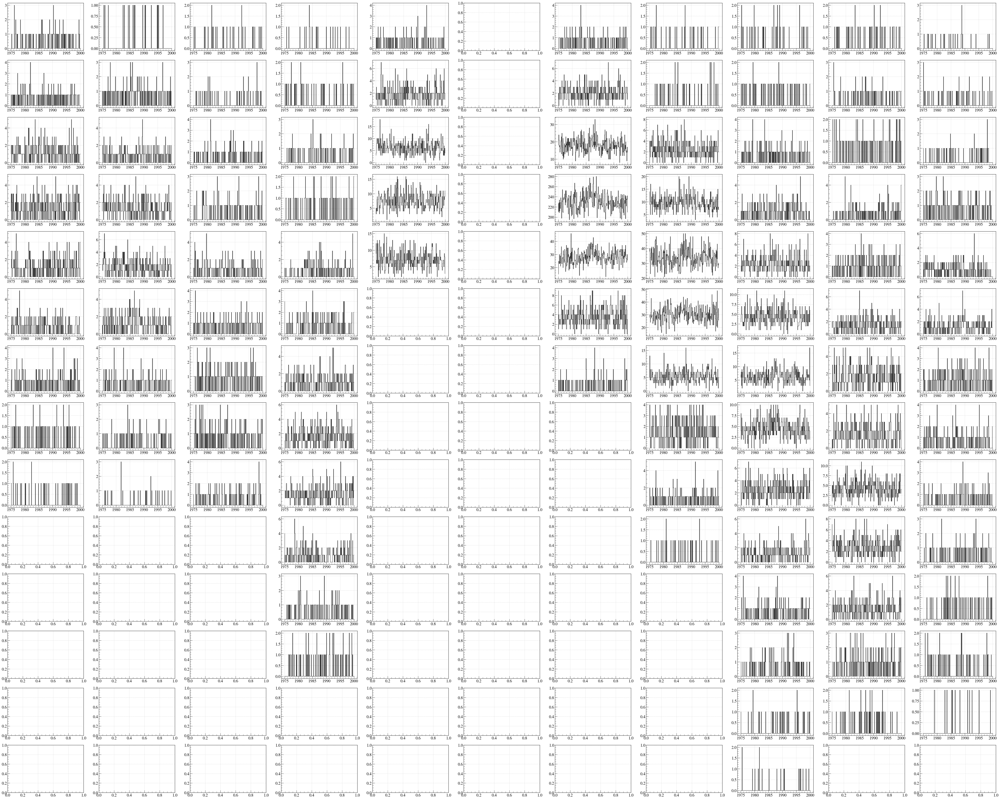

In [4]:
# get gamma peak counts
fig, ax = plt.subplots(14,11, figsize=(70,55), sharex=False, sharey=False)
# geds = df_gamma['mage_id'].unique()
def get_peak_counts_vanc(df, Co_primaries, geds, peak, plot=True, bkg_density_df=None):
    # print('geds', geds)
    d = df[df['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=binsize)
    b_mids = (b[1:] + b[:-1])/2
    if plot:
        ged_str = str(geds[0])
        row = int(ged_str[5:7])-1
        col = int(ged_str[3:5])-1
        ax[row, col].plot(b_mids, h, ds='steps', lw=1, color='k')
        # fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[row, col], lw=1)
        # if geds[0]==1010104:
        #     print(fit_params)
    N = h[(b_mids>peak['peak_range'][0]) & (b_mids < peak['peak_range'][1])].sum()
    B_left = h[(b_mids > peak['sidebands'][0][0]) & (b_mids < peak['sidebands'][0][1])].sum()
    B_right = h[(b_mids > peak['sidebands'][1][0]) & (b_mids < peak['sidebands'][1][1])].sum()
    B = B_left+B_right
    # print('N,B:',N,B)

    return (N,B)

peak_counts_vanc = []
geds_vanc = df_vanc['mage_id'].unique()
for ged in geds_vanc:
    peak_counts_vanc.append(get_peak_counts_vanc(df_vanc, primaries_vanc, [ged], peaks['1987']))
peak_counts_df_vanc = pd.DataFrame({'mage_id': geds_vanc, 'peak_counts': peak_counts_vanc})
# fig.savefig(results_dir+'1987_spectra_from_gamma_each_det.png')
# fig.savefig(results_dir+'1987_spectra_from_gamma_sis2_pos3_each_det.png')
peak_counts_df_vanc
# peak_counts_map = get_param_map(peak_counts_df, param='peak_counts', id='mage_id')
# peak_counts_map

In [8]:
peak_counts_df_vanc['survival_frac_unc']  = peak_counts_df_vanc['peak_counts'].apply(get_rel_unc)
peak_counts_df_vanc

,mage_id,peak_counts,survival_frac_unc
0,1010704,"(19008, 38592)",0.079067
1,1011102,"(19, 35)",0.825019
2,1010906,"(364, 725)",0.404881
3,1010805,"(2770, 5701)",0.293902
4,1010806,"(2503, 5077)",0.213489
...,...,...,...
96,1010109,"(10, 31)",0.361129
97,1010901,"(17, 24)",0.334033
98,1010209,"(9, 23)",0.830635
99,1011101,"(13, 14)",0.252496


In [11]:
peak_counts_df_vanc['unc_over_time'] = peak_counts_df_vanc['survival_frac_unc'].apply(get_survival_frac_unc_over_time, Co_primaries=primaries_vanc, days_elapsed=np.arange(1, 15, 0.1))
peak_counts_df_vanc

,mage_id,peak_counts,survival_frac_unc,unc_over_time
0,1010704,"(19008, 38592)",0.079067,"[0.02171238926515321, 0.020706588804860385, 0...."
1,1011102,"(19, 35)",0.825019,"[0.2265560572074332, 0.2160611188642321, 0.206..."
2,1010906,"(364, 725)",0.404881,"[0.11118301387326787, 0.10603259375299341, 0.1..."
3,1010805,"(2770, 5701)",0.293902,"[0.08070760915886523, 0.07696892570722864, 0.0..."
4,1010806,"(2503, 5077)",0.213489,"[0.05862557087517189, 0.0559098114324369, 0.05..."
...,...,...,...,...
96,1010109,"(10, 31)",0.361129,"[0.09916866267474446, 0.09457479300214405, 0.0..."
97,1010901,"(17, 24)",0.334033,"[0.09172775218433364, 0.08747857378936541, 0.0..."
98,1010209,"(9, 23)",0.830635,"[0.2280981737413799, 0.21753179869442743, 0.20..."
99,1011101,"(13, 14)",0.252496,"[0.06933720405683838, 0.06612524102024561, 0.0..."


In [17]:
peak_counts_df_vanc['unc_over_time'][10][90]
unc_10 = [peak_counts_df_vanc['unc_over_time'][i][90] for i in range(peak_counts_df_vanc.shape[0])]
peak_counts_df_vanc['unc_10'] = unc_10
peak_counts_df_vanc

,mage_id,peak_counts,survival_frac_unc,unc_over_time,unc_10
0,1010704,"(19008, 38592)",0.079067,"[0.02171238926515321, 0.020706588804860385, 0....",0.007005
1,1011102,"(19, 35)",0.825019,"[0.2265560572074332, 0.2160611188642321, 0.206...",0.073093
2,1010906,"(364, 725)",0.404881,"[0.11118301387326787, 0.10603259375299341, 0.1...",0.035870
3,1010805,"(2770, 5701)",0.293902,"[0.08070760915886523, 0.07696892570722864, 0.0...",0.026038
4,1010806,"(2503, 5077)",0.213489,"[0.05862557087517189, 0.0559098114324369, 0.05...",0.018914
...,...,...,...,...,...
96,1010109,"(10, 31)",0.361129,"[0.09916866267474446, 0.09457479300214405, 0.0...",0.031994
97,1010901,"(17, 24)",0.334033,"[0.09172775218433364, 0.08747857378936541, 0.0...",0.029594
98,1010209,"(9, 23)",0.830635,"[0.2280981737413799, 0.21753179869442743, 0.20...",0.073590
99,1011101,"(13, 14)",0.252496,"[0.06933720405683838, 0.06612524102024561, 0.0...",0.022370


In [19]:
peak_counts_df_vanc['det_name'] = peak_counts_df_vanc['mage_id'].apply(lambda x : lu.get_det_id_from_mage_id(x))
peak_counts_df_vanc

,mage_id,peak_counts,survival_frac_unc,unc_over_time,unc_10,det_name
0,1010704,"(19008, 38592)",0.079067,"[0.02171238926515321, 0.020706588804860385, 0....",0.007005,V04545A
1,1011102,"(19, 35)",0.825019,"[0.2265560572074332, 0.2160611188642321, 0.206...",0.073093,B00002B
2,1010906,"(364, 725)",0.404881,"[0.11118301387326787, 0.10603259375299341, 0.1...",0.035870,P00538A
3,1010805,"(2770, 5701)",0.293902,"[0.08070760915886523, 0.07696892570722864, 0.0...",0.026038,V00050A
4,1010806,"(2503, 5077)",0.213489,"[0.05862557087517189, 0.0559098114324369, 0.05...",0.018914,V00050B
...,...,...,...,...,...,...
96,1010109,"(10, 31)",0.361129,"[0.09916866267474446, 0.09457479300214405, 0.0...",0.031994,V07647B
97,1010901,"(17, 24)",0.334033,"[0.09172775218433364, 0.08747857378936541, 0.0...",0.029594,B00002A
98,1010209,"(9, 23)",0.830635,"[0.2280981737413799, 0.21753179869442743, 0.20...",0.073590,V07298B
99,1011101,"(13, 14)",0.252496,"[0.06933720405683838, 0.06612524102024561, 0.0...",0.022370,B00000A


In [20]:
umv = get_param_map(peak_counts_df_vanc, param='unc_10', id='mage_id')
umv.round(3)

,String 1,String 2,String 3,String 4,String 5,String 7,String 8,String 9,String 10,String 11
1,0.087,0.025,0.169,0.033,0.057,0.054,0.220,0.030,0.177,0.022
2,0.105,0.020,0.013,0.037,0.320,0.074,0.888,0.029,0.015,0.073
3,0.034,0.029,0.032,0.033,0.052,0.022,0.179,0.020,0.085,0.049
4,0.087,0.178,0.101,0.114,0.032,0.007,0.015,0.034,0.124,0.055
5,0.036,0.375,0.129,0.017,0.167,0.012,0.026,0.022,0.021,0.038
6,0.389,0.012,0.041,0.023,NaN,0.177,0.019,0.036,0.017,0.018
7,0.104,0.045,0.113,0.092,NaN,0.029,0.041,0.026,4.137,0.048
8,0.088,0.045,0.184,0.036,NaN,NaN,0.034,0.012,0.106,0.035
9,0.032,0.074,0.056,0.111,NaN,NaN,0.048,0.055,0.013,0.048
10,NaN,NaN,NaN,0.018,NaN,NaN,0.043,0.018,0.059,0.064


In [23]:
unc_10_V_vanc = peak_counts_df_vanc[peak_counts_df_vanc['det_name'].str.startswith('V')]['unc_10'].mean()
unc_10_B_vanc = peak_counts_df_vanc[peak_counts_df_vanc['det_name'].str.startswith('B')]['unc_10'].mean()
unc_10_C_vanc = peak_counts_df_vanc[peak_counts_df_vanc['det_name'].str.startswith('C')]['unc_10'].mean()
unc_10_P_vanc = peak_counts_df_vanc[peak_counts_df_vanc['det_name'].str.startswith('P')]['unc_10'].mean()
# create dataframe with these as columns
unc_avg_df_vanc = pd.DataFrame({'Det Type':['V','B','C','P'], 'Avg unc after 40 days (0.5uCi)':[unc_10_V_vanc, unc_10_B_vanc, unc_10_C_vanc, unc_10_P_vanc]})
unc_avg_df_vanc

,Det Type,Avg unc after 40 days (0.5uCi)
0,V,0.080442
1,B,0.238092
2,C,0.132201
3,P,0.053845


In [ ]:
peak = peaks['1987']
d = df_vanc[df_vanc['energy'].between(peak['sidebands'][0][0], peak['sidebands'][1][1])]
d = d[d['mage_id']==1010704]
h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
b_mids = (b[:-1]+b[1:])/2
plt.plot(b_mids, h, ds='steps', lw=1)
fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=plt.gca())
h.sum()/(b[-1]-b[0])/primaries_vanc

: 

In [ ]:
# get bkg_density df
fig, ax = plt.subplots(14,11, figsize=(70,55), sharex=False, sharey=False)
geds = df_vanc['mage_id'].unique()

bkg_density = []
for ged in geds:
    bkg_density.append(get_bkg_per_keV_per_primary(df_vanc, primaries_vanc, [ged], peaks['1987']))
bkg_density_df_vanc = pd.DataFrame({'mage_id': geds, 'bkg_density': bkg_density})
print(bkg_density_df_vanc)
bkg_density_map_vanc = get_param_map(bkg_density_df_vanc, param='bkg_density', id='mage_id')
(bkg_density_map_vanc*1e6).round(2)

: 

In [ ]:
peak = peaks['1987']
print(peak['sidebands'][0][0], peak['sidebands'][1][1])
d = df_vanc[df_vanc['mage_id']==1010913]
h,b,v = pgh.get_hist(df_vanc['energy'], range=(peak['sidebands'][0][0],peak['sidebands'][1][1]), dx=0.2)
b_mids = (b[1:] + b[:-1])/2
plt.plot(b_mids, h, ds='steps', lw=1)

# sum of h within sidebands
h_sidebands = h[(b_mids>peak['sidebands'][0][0]) & (b_mids<peak['sidebands'][0][1])]
h_sidebands_2 = h[(b_mids>peak['sidebands'][1][0]) & (b_mids<peak['sidebands'][1][1])]
print(h_sidebands.sum()+h_sidebands_2.sum())
h_peak = h[(b_mids>peak['sidebands'][0][1]) & (b_mids<peak['sidebands'][1][0])]
print(h_peak.sum())
get_rel_unc((h_sidebands.sum()+h_sidebands_2.sum(), h_peak.sum()), peaks['1987'])

: 

In [ ]:
evt_filenames = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_3009_sis2_neg376mm_old.txt'
df = pd.DataFrame()
primaries = 0
with open(evt_filenames) as f:
    evt_filenames = f.read().splitlines()
    for evt_filename in evt_filenames:
        # print(evt_filename)
        ff = ur.open(evt_filename)
        # print(evt_filename, 'opened')
        dets = ff['simTree/mage_id'].array(library='np')
        primaries += len(dets)
        dets = np.concatenate(dets)
        
        energies = ff['simTree/energy'].array(library='np')
        energies = np.concatenate(energies)
        d = pd.DataFrame({'mage_id': dets, 'energy': energies})
        df = pd.concat([df, d], ignore_index=True)
   
print(primaries)
df['energy'] = df['energy'].apply(lambda x: x*1000)
df

: 

In [ ]:
def get_scaled_Co_primaries(full_Co_primaries, full_Co_energies, gamma_energies, peak, axis=None):
    h,b,v = pgh.get_hist(full_Co_energies, range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
    b_mids = (b[1:] + b[:-1])/2
    # plt.figure()
    fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=axis)
    full_Co_peak_count = fit_params['area']

    h,b,v = pgh.get_hist(gamma_energies, range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
    b_mids = (b[1:] + b[:-1])/2
    # plt.figure()
    fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=axis)
    gamma_peak_count = fit_params['area']

    return full_Co_primaries * gamma_peak_count/full_Co_peak_count


scaled_Co_primaries = get_scaled_Co_primaries(primaries_vanc, df_vanc['energy'], df['energy'], dep_peaks['1987'], axis=plt.gca())
print('gamma_scaled_primaries', scaled_Co_primaries/1e6, 'M')


: 

In [ ]:
def get_bkg_per_keV_per_primary(full_Co_df, full_Co_primaries, geds, peak):
    d = full_Co_df[full_Co_df['mage_id'].isin(geds)]
    h,b,v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.1)
    b_mids = (b[1:] + b[:-1])/2
    fit_params = lu.fit_peak_binned_extra_basic(b_mids, h)
    peak_count = fit_params['area']
    return (np.sum(h) - peak_count)/(b[-1]-b[0])/full_Co_primaries
bkg_per_keV_per_primary_full_Co = get_bkg_per_keV_per_primary(df_vanc, primaries_vanc, dets_to_use, dep_peaks['1987'])
print('bkg_per_keV_per_primary_full_Co', bkg_per_keV_per_primary_full_Co)

: 

In [ ]:

    
def compare_one_gamma_sim(df_full_Co, primaries_full_Co, df_one_gamma, peak, dets_to_use, axis=None):
    bkg_per_keV_per_primary_full_Co = get_bkg_per_keV_per_primary(df_full_Co, primaries_full_Co, dets_to_use, peak)
    print('bkg_per_keV_per_primary_full_Co', bkg_per_keV_per_primary_full_Co)

    d = df_vanc[df_vanc['mage_id'].isin(dets_to_use)]
    h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
    b_mids = (b[1:] + b[:-1])/2
    axis.plot(b_mids, h, ds='steps', c='k', lw=1, label='full 56Co')
    # fit_params = lu.fit_peak_binned_extra_basic(b_mids, h, axis=plt.gca(), lw=1)

    d = df_one_gamma[df_one_gamma['mage_id'].isin(dets_to_use)]
    h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
    b_mids = (b[1:] + b[:-1])/2
    axis.plot(b_mids, h, ds='steps', c='tab:blue', lw=1, label='unscaled 3009 gamma sim')
    scaled_Co_primaries = get_scaled_Co_primaries(primaries_full_Co, df_full_Co['energy'], df_one_gamma['energy'], peak, axis=None)
    left_bkg = np.sum(h[0:np.argmax(b_mids>peak['sidebands'][0][1])])
    # print('left_bkg', left_bkg)
    total_bkg = left_bkg*(b[-1]-b[0])/(peak['sidebands'][0][1]-peak['sidebands'][0][0])
    # print('total_bkg', total_bkg)
    h = h-total_bkg/len(h)
    h = h*primaries_full_Co/scaled_Co_primaries

    new_bkg = bkg_per_keV_per_primary_full_Co*primaries_vanc*(b[-1]-b[0])
    h = h+new_bkg/len(h)
    axis.plot(b_mids, h, ds='steps', c='tab:orange', lw=1, label='Scaled from 3009 gamma sim')

    plt.legend()
    # plt.ylim(400,500)


fig, ax = plt.subplots(2,2, figsize=(10,10))


peak = dep_peaks['1987']
dets_to_use = [1010704]
compare_one_gamma_sim(df_vanc, primaries_vanc, df, peak, dets_to_use, axis=ax[0,0])
ax[0,0].set_title('1987 in '+str(dets_to_use))
dets_to_use = [1010809]
compare_one_gamma_sim(df_vanc, primaries_vanc, df, peak, dets_to_use, axis=ax[0,1])
ax[0,1].set_title('1987 in '+str(dets_to_use))

peak = fep_peaks['3009']
dets_to_use = [1010704]
compare_one_gamma_sim(df_vanc, primaries_vanc, df, peak, dets_to_use, axis=ax[1,0])
ax[1,0].set_title('3009 in '+str(dets_to_use))
dets_to_use = [1010809]
compare_one_gamma_sim(df_vanc, primaries_vanc, df, peak, dets_to_use, axis=ax[1,1])
ax[1,1].set_title('3009 in '+str(dets_to_use))


: 

In [ ]:
peak = dep_peaks['1987']
peak = fep_peaks['3009']
fig, ax = plt.subplots(1,2, figsize=(16,6))
bkg_per_kev_vancouver = 0 # bkg/keV
for i,peak in enumerate([fep_peaks['3009'], dep_peaks['1987']]):
    d = df_vanc[df_vanc['mage_id'].isin(dets_to_use)]
    hv, bv, vv = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
    bv_mids = (bv[1:] + bv[:-1])/2
    ax[i].plot(bv_mids, hv, ds='steps', lw=1, color='k')
    # get sum of hv where 1960<bv<1975

    left_bkg = np.sum(hv[np.where((bv>peak['sidebands'][0][0]) & (bv<peak['sidebands'][0][1]))])
    right_bkg = np.sum(hv[np.where((bv>peak['sidebands'][1][0]) & (bv<peak['sidebands'][1][1]))])
    bkg_vanc = left_bkg + right_bkg
    print(bkg_vanc)
    print(get_peak_and_bkg_count(hv, bv))

    fit_results = lu.fit_peak_binned_extra_basic(bv_mids, hv, axis=ax[i], lw=1)
    ax[i].set_title('Peak count:'+ str(round(fit_results['area'],2))+'+/-'+str(round(fit_results['area_err'],2)))

    if i==0:
        peak_count_3009_vanc = fit_results['area']
print('peak_count_vanc', peak_count_3009_vanc)

: 

In [ ]:
evt_filenames = '/global/homes/f/fnafis/LEGEND/legend/sims/evt_filenames_3009_sis2_neg376mm.txt'
df = pd.DataFrame()
primaries = 0
with open(evt_filenames) as f:
    evt_filenames = f.read().splitlines()
    for evt_filename in evt_filenames:
        print(evt_filename)
        ff = ur.open(evt_filename)
        # print(evt_filename, 'opened')
        dets = ff['simTree/mage_id'].array(library='np')
        primaries += len(dets)
        dets = np.concatenate(dets)
        
        energies = ff['simTree/energy'].array(library='np')
        energies = np.concatenate(energies)
        d = pd.DataFrame({'mage_id': dets, 'energy': energies})
        df = pd.concat([df, d], ignore_index=True)
   
print(primaries)
df['energy'] = df['energy'].apply(lambda x: x*1000)
df

: 

New one FEP sim

In [ ]:
peak = dep_peaks['1987']
peak = fep_peaks['3009']
fig, ax = plt.subplots(1,2, figsize=(16,6))
for i,peak in enumerate([fep_peaks['3009'], dep_peaks['1987']]):
    d = df[df['mage_id'].isin(dets_to_use)]
    h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
    b_mids = (b[1:] + b[:-1])/2
    ax[i].plot(b_mids, h, ds='steps', lw=1, color='k')
    # get sum of hv where 1960<bv<1975
    print(get_peak_and_bkg_count(h, b))
    left_bkg = np.sum(h[np.where((b>peak['sidebands'][0][0]) & (b<peak['sidebands'][0][1]))])
    right_bkg = np.sum(h[np.where((b>peak['sidebands'][1][0]) & (b<peak['sidebands'][1][1]))])
    bkg_new = left_bkg + right_bkg
    print(bkg_new)

    
    fit_results = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax[i], lw=1)
    ax[i].set_title('Peak count:'+ str(round(fit_results['area'],2))+'+/-'+str(round(fit_results['area_err'],2)))

    if i==0:
        peak_count_3009_new = fit_results['area']
print('peak_count_new', peak_count_3009_new)

: 

In [ ]:
dets_to_use

: 

In [ ]:
dets_to_use = [1010704]
h,b,v = pgh.get_hist(df_vanc['energy'][df_vanc['mage_id'].isin(dets_to_use)], range=(1500, 3500), dx=1)
b_mids = (b[1:] + b[:-1])/2
fig, ax = plt.subplots(2,1, figsize=(12,12))
ax[0].plot(b_mids, h, ds='steps', lw=1, color='k')
ax[0].set_yscale('log')
ax[0].set_title('Full Co sim '+str(dets_to_use))

h,b,v = pgh.get_hist(df['energy'][df['mage_id'].isin(dets_to_use)], range=(1500, 3500), dx=1)
b_mids = (b[1:] + b[:-1])/2
ax[1].plot(b_mids, h, ds='steps', lw=1, color='k')
ax[1].set_yscale('log')
ax[1].set_title('3009 gamma sim '+str(dets_to_use))

: 

In [ ]:
peak = dep_peaks['1987']

d_vanc = df_vanc[df_vanc['mage_id'].isin(dets_to_use)]
h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
peak_count_1987_vanc, bkg_1987_vanc, _ = get_peak_and_bkg_count(h, b)
print('peak_count_1987_vanc', peak_count_1987_vanc, 'bkg_1987_vanc', bkg_1987_vanc)
d = df[df['mage_id'].isin(dets_to_use)]
h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
peak_count_1987_new, bkg_1987_new, _ = get_peak_and_bkg_count(h, b)
print('peak_count_1987_new', peak_count_1987_new, 'bkg_1987_new', bkg_1987_new)

old_to_new_1987_peak_count_ratio = peak_count_1987_new/peak_count_1987_vanc


: 

In [ ]:
def get_scaled_spectrum(df_full_Co, primaries_full_Co, df_one_gamma, primaries_one_gamma, peak, dets_to_use):
    bkg_per_keV_per_primary_full_Co = get_bkg_per_keV_per_primary(df_full_Co, primaries_full_Co, dets_to_use, peak)
    d = df_one_gamma[df_one_gamma['mage_id'].isin(dets_to_use)]
    h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
    

: 

In [ ]:
peak = dep_peaks['1987']
primaries_vanc = 120e6
old_to_new_factor = peak_count_3009_new/peak_count_3009_vanc
print('old_to_new_factor', old_to_new_factor)
primaries_new = primaries_vanc*old_to_new_factor
print('primaries_new', primaries_new)


# sse survival probability
def get_survival_probability_uncertainty(d, peak, old_to_new_factor):
    h, b, v = pgh.get_hist(d['energy'], range=(peak['sidebands'][0][0], peak['sidebands'][1][1]), dx=0.2)
    b_mids = (b[1:] + b[:-1])/2

    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(b_mids, h, ds='steps', lw=1, color='k')
    fit_results = lu.fit_peak_binned_extra_basic(b_mids, h, axis=ax, lw=1)
    peak_count = fit_results['area']
    print('peak_count', peak_count)

    # total events in d between end of first sideband and start of second sideband
    left_bkg = np.sum(h[np.where((b>peak['sidebands'][0][0]) & (b<peak['sidebands'][0][1]))])
    right_bkg = np.sum(h[np.where((b>peak['sidebands'][1][0]) & (b<peak['sidebands'][1][1]))])
    B = left_bkg + right_bkg
    B = B*old_to_new_factor
    print('B_sideband', B)
    N = np.sum(h[np.where((b>peak['sidebands'][0][1]) & (b<peak['sidebands'][1][0]))])
    N = N*old_to_new_factor
    print('N_sideband', N)
    tau = (peak['sidebands'][1][0]-peak['sidebands'][0][1])/(peak['sidebands'][1][1]-peak['sidebands'][1][0]+peak['sidebands'][0][1]-peak['sidebands'][0][0])
    print('tau',tau)
    epsilon = 0.9
    N_c = N*epsilon
    B_c = B*epsilon
    rel_unc_sqrd = (N+tau**2*B)/(N-tau*B)**2 + (N_c+tau**2*B_c)/(N_c-tau*B_c)**2 - 2*(N_c+tau**2*B_c)/(N_c-tau*B_c)/(N-tau*B)
    rel_unc = np.sqrt(rel_unc_sqrd)
    print('rel_unc', rel_unc)
    return rel_unc


d = df_vanc[df_vanc['mage_id'].isin(dets_to_use)]
unc_vanc = get_survival_probability_uncertainty(d, dep_peaks['1987'], old_to_new_factor=1.0)
print('unc_vanc', unc_vanc)
d = df[df['mage_id'].isin(dets_to_use)]
unc_new = get_survival_probability_uncertainty(d, dep_peaks['1987'], old_to_new_factor=old_to_new_factor)
print('unc_new', unc_new)


: 

In [ ]:
def get_unc_over_time(primaries, unc, **kwargs):
    source_activity_uCi = 1 #uCi
    source_activity_Bq = source_activity_uCi*3.7e4 #Bq

    half_life = 77.236 # days
    half_life = half_life*24*60*60 # seconds
    decay_constant = np.log(2)/half_life # 1/s

    days_elapsed = np.arange(1, 29, 1)
    uncs = []
    for d in days_elapsed:
        N = source_activity_Bq/decay_constant*(1-np.exp(-decay_constant*d*86400))
        uncertainty = unc*np.sqrt(primaries/N)
        uncs.append(uncertainty)

    plt.plot(days_elapsed, uncs, lw=1, **kwargs)

    plt.yscale('log')
    # plt.xscale('log')
    plt.xlabel('Days')
    plt.ylabel(r'$\frac{\sigma_{\epsilon}}{\epsilon(=0.9)}$')
    plt.title('1987 in '+str(dets_to_use))

get_unc_over_time(primaries_vanc, unc_vanc, label='Vanc (with full 56Co)')
get_unc_over_time(primaries_new, unc_new, label='New (with 3009 FEP)')
plt.legend()

: 